In [1]:
import sys
sys.path.append('..')
import os
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.getcwd()
from gax import sersic
from gax.sersic import sersic_2d_linear_pix
from matplotlib import pyplot as plt
import jax
import jax.numpy as jnp
import astropy
import numpy as np
from astropy.table import Table, vstack
import gax_fits as gfits
from astropy.io import fits
from scipy.interpolate import RegularGridInterpolator

bands = np.array(['U','G','R','I','Z'])
wavs = np.array([354.3e-9, 477.0e-9, 623.1e-9, 762.5e-9, 913.4e-9], dtype=float)



In [2]:
# Original
M51_B = gfits.Read('/home/borge/Data/Case_studies/HST/M51/m51_optical_B.fits')
M51_G = gfits.Read('/home/borge/Data/Case_studies/HST/M51/m51_optical_G.fits')
M51_R = gfits.Read('/home/borge/Data/Case_studies/HST/M51/m51_optical_R.fits')

# Isolated
M51_B_I = gfits.Read('/home/borge/Data/Case_studies/HST/M51/m51_optical_B_masked/0200/small_nonpar.fits')
M51_G_I = gfits.Read('/home/borge/Data/Case_studies/HST/M51/m51_optical_G_masked/0200/small_nonpar.fits')
M51_R_I = gfits.Read('/home/borge/Data/Case_studies/HST/M51/m51_optical_R_masked/0200/small_nonpar.fits')

# Tables
M51_B_Table = gfits.Read_Table('/home/borge/Data/Case_studies/HST/M51/m51_optical_B_masked/0200/source_params.fits')
M51_G_Table = gfits.Read_Table('/home/borge/Data/Case_studies/HST/M51/m51_optical_G_masked/0200/source_params.fits')
M51_R_Table = gfits.Read_Table('/home/borge/Data/Case_studies/HST/M51/m51_optical_R_masked/0200/source_params.fits')

In [3]:
# Fix the R band Table:
gal_centre = [1172,1394]
relative_centre = [M51_B.shape[1]/2-gal_centre[0],M51_B.shape[0]/2-gal_centre[1]]
print(relative_centre)
M51_R_Table['x'] = -1*relative_centre[0]
M51_R_Table['y'] = -1*relative_centre[1]

[20.0, 406.0]


In [4]:
def Overlay_table_info(Image,Table,inner_multiple,outer_multiple):
    
    # Get table information
    x_centre = Image.shape[1]/2 + Table['x']
    y_centre = Image.shape[0]/2 + Table['y']
    R_e      = 10**Table['log_re']
    
    # Create the Circle patch using table information
    R_e_patch = plt.Circle((x_centre,y_centre),R_e,fill=None)
    inner_multiple_patch = plt.Circle((x_centre,y_centre),R_e*inner_multiple,fill=None,color='r',linestyle='--')
    outer_multiple_patch = plt.Circle((x_centre,y_centre),R_e*outer_multiple,fill=None,color='r',linestyle='--')
    
    # Begin plotting
    fig, ax = plt.subplots()
    ax.imshow(Image)
    ax.plot(x_centre,y_centre,'rx')
    ax.add_patch(R_e_patch)
    ax.add_patch(inner_multiple_patch)
    ax.add_patch(outer_multiple_patch)
    
        
    
    
    
     
    

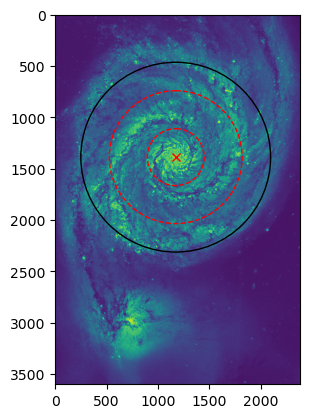

In [5]:
Overlay_table_info(M51_B,M51_B_Table,0.3,0.7)

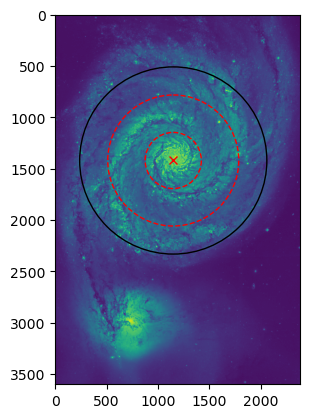

In [6]:
Overlay_table_info(M51_G,M51_G_Table,0.3,0.7)

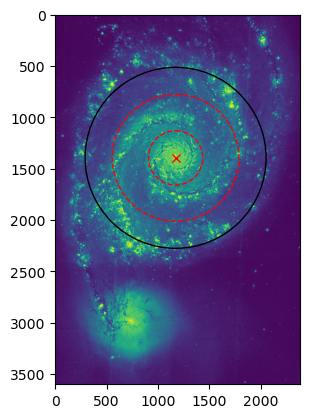

In [7]:
Overlay_table_info(M51_R,M51_R_Table,0.3,0.7)

In [9]:
# We need to use Spiral Power Spec on the images and then use gen_spiral on the result
A, A_p_m, p, SN_w, p_max, SN_m, phi = gfits.Spiral_power_spec(M51_R_I,M51_R_Table,0.3,2,byte_order=True)


In [10]:
# Apply gen_spiral
m = 2
multiple = 0.3
multiple_2 = 0.7
x_centre = M51_R.shape[1]/2 + M51_R_Table['x']
y_centre = M51_R.shape[0]/2 + M51_R_Table['y']
R_e      = 10**M51_R_Table['log_re']

spiral_x, spiral_y, argument = gfits.gen_spiral(p_max,A_p_m,m,R_e,multiple,M51_R_I,x_centre,y_centre)

# Not working
print(R_e)

      log_re     
-----------------
881.3287119378433


In [11]:
# Get image info:
height, width = M51_R_I.shape[:2]   

# Create Polar Spiral
A_p_max = A_p_m[np.argmax(A_p_m)]
argument = np.radians(91)#np.angle(A_p_max)
r_0 = 1                                     # Scale 1:1 pix
theta = np.linspace(2*np.pi,8*(np.pi),3600)
phi = 19.3 #np.degrees(np.arctan((0-m)/p_max))
print("Phi=",phi)
r = r_0 *np.exp(theta*np.abs(np.tan(np.radians(phi)))) 
print("r=",r)
# Convert to Cartesian
x = r*np.cos(theta)
y = r*np.sin(theta) 
vector = np.stack([x,y],axis=1).T

rot_mat = np.array([[np.cos(argument),-np.sin(argument)],
                [np.sin(argument), np.cos(argument)]])

rotated_vector = rot_mat @ vector

x_ = rotated_vector[0] + x_centre
y_ = rotated_vector[1] + y_centre
print("x_.shape=",x_.shape)
# Trim line plot so that it doesn't enter the unsampled area or outside the image
count_c = 0
count_e = 0 
for i in range(0,len(x_)):
    if np.sqrt(x_[i]**2 + (y_[i]**2)) <= multiple*R_e:
        count_c += 1
    elif  np.sqrt(x_[i]**2 + (y_[i]**2)) > multiple_2*R_e:
        count_e = count_e + 1
    else:
        continue
x_ = x_[count_c:len(x_)-count_e]
y_ = y_[count_c:len(y_)-count_e]


x_.shape,count_c

Phi= 19.3
r= [   9.02808435    9.04465819    9.06126246 ... 6618.95349362 6631.10463035
 6643.27807424]
x_.shape= (3600,)


((75,), 50)

In [12]:
# Going to try with a Boolean array instead
# Get image info:
height, width = M51_R_I.shape[:2]   

# Create Polar Spiral
A_p_max = A_p_m[np.argmax(A_p_m)]
argument = np.radians(35)#np.angle(A_p_max)
argument_2 = np.radians(35+180)
r_0 = 1                                     # Scale 1:1 pix
theta = np.linspace(2*np.pi,8*(np.pi),3600)
phi = 19.3 #np.degrees(np.arctan((0-m)/p_max))
print(phi)
r = r_0 *np.exp(theta*np.abs(np.tan(np.radians(phi)))) 

# Convert to Cartesian
x = r*np.cos(theta)
y = r*np.sin(theta) 
vector = np.stack([x,y],axis=1).T

rot_mat = np.array([[np.cos(argument),-np.sin(argument)],
                [np.sin(argument), np.cos(argument)]])

rot_mat_2 = np.array([[np.cos(argument_2),-np.sin(argument_2)],
                [np.sin(argument_2), np.cos(argument_2)]])

rotated_vector = rot_mat @ vector
rotated_vector_2 = rot_mat_2 @ vector

x_ = rotated_vector[0] #+ x_centre
y_ = rotated_vector[1] #+ y_centre

x_2 = rotated_vector_2[0] #+ x_centre
y_2 = rotated_vector_2[1] #+ y_centre
print("x_.shape=",x_.shape)
range_min = 0.3 * R_e
range_max = 0.7 * R_e

# Create a boolean mask to filter out points outside the range
mask = (np.sqrt(x_**2 + y_**2) >= range_min) & (np.sqrt(x_**2 + y_**2) <= range_max)

# Apply the mask to the data
x_trimmed = x_[mask] + x_centre
y_trimmed = -1*(y_[mask]) + y_centre

x_2_trimmed = x_2[mask] + x_centre
y_2_trimmed = -1*(y_2[mask]) + y_centre

print("x_trimmed=",x_trimmed.shape," y_trimmed.shape=",y_trimmed.shape)

19.3
x_.shape= (3600,)
x_trimmed= (462,)  y_trimmed.shape= (462,)


In [13]:
# Co-rotation radius
CR = 5.3*0.1165378852098284


462


array([ 994.00035522, 1034.80296808, 1092.79139899, 1167.03074722,
       1255.26698656, 1353.84362379, 1457.70204914, 1560.48093753,
       1654.72588989, 1732.21477763, 1785.18698682])

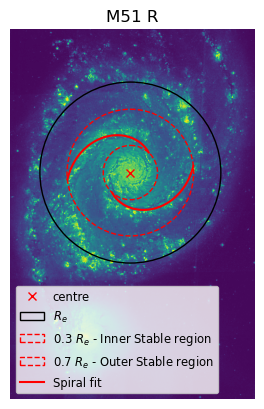

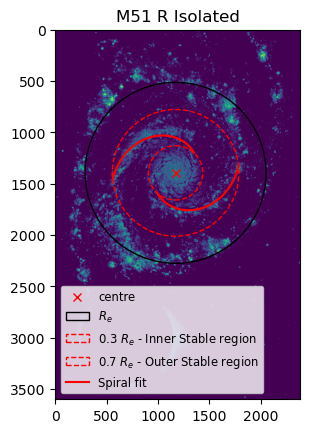

In [14]:

Overlay_table_info(M51_R,M51_R_Table,0.3,0.7)
plt.title('M51 R')
plt.plot(x_trimmed,y_trimmed,'r')
plt.plot(x_2_trimmed,y_2_trimmed,'r')
plt.axis('off')
plt.legend(['centre','$R_e$','0.3 $R_e$ - Inner Stable region','0.7 $R_e$ - Outer Stable region','Spiral fit'],fontsize='small')


Overlay_table_info(M51_R_I,M51_R_Table,0.3,0.7)
plt.title('M51 R Isolated')
plt.plot(x_trimmed,y_trimmed,'r')
plt.plot(x_2_trimmed,y_2_trimmed,'r')
plt.legend(['centre','$R_e$','0.3 $R_e$ - Inner Stable region','0.7 $R_e$ - Outer Stable region','Spiral fit'],fontsize='small')
print(len(x_trimmed))
nob = np.linspace(0,len(x_trimmed)-1,11,dtype=int) 
x_trimmed[nob]

In [15]:
spir_points = np.vstack([x_trimmed,y_trimmed]).T
spir_points_2 = np.vstack([x_2_trimmed,y_2_trimmed]).T
spir_points.shape
len(spir_points)

462

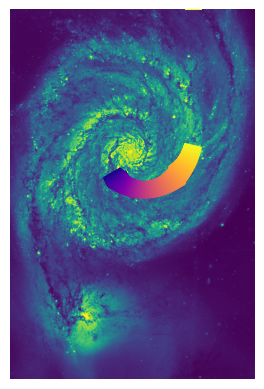

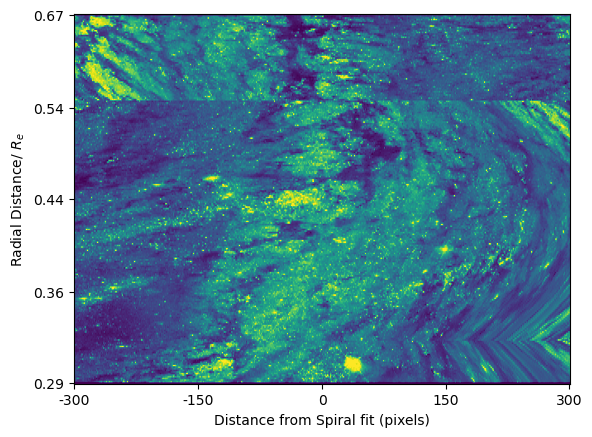

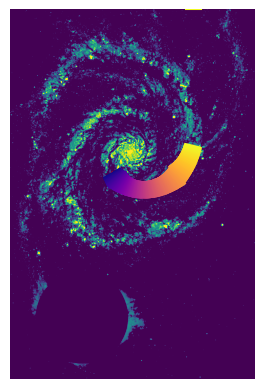

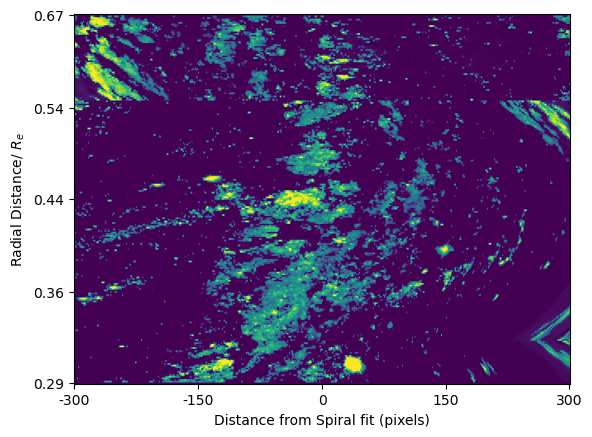

In [16]:
# Want to try and get the normal sampled image from these now
stacked_arm_1_O = gfits.Spiral_normal_distributions(M51_B,M51_B_Table,spir_points,int(len(x_trimmed)/2),300,True,False)
stacked_arm_1_I = gfits.Spiral_normal_distributions(M51_B_I,M51_B_Table,spir_points,int(len(x_trimmed)/2),300,True,False)
# not working lol surpirse surprise

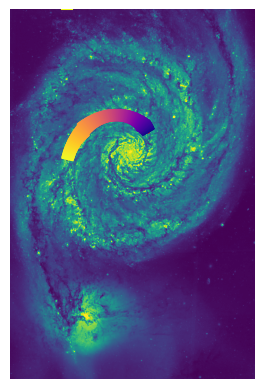

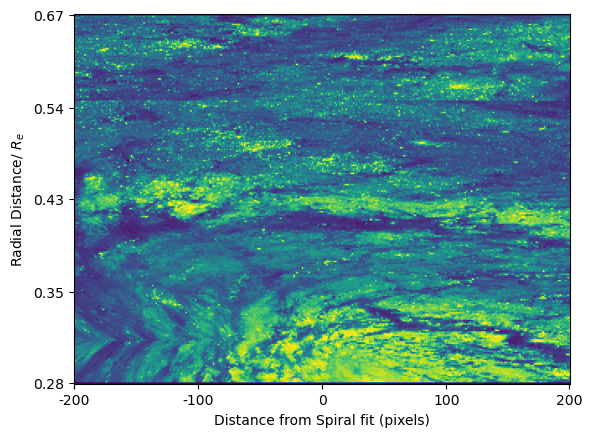

In [17]:
stacked_arm_2 = gfits.Spiral_normal_distributions(M51_B,M51_B_Table,spir_points_2,int(len(x_trimmed)/2),200,True,False)

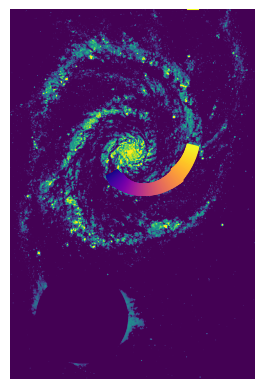

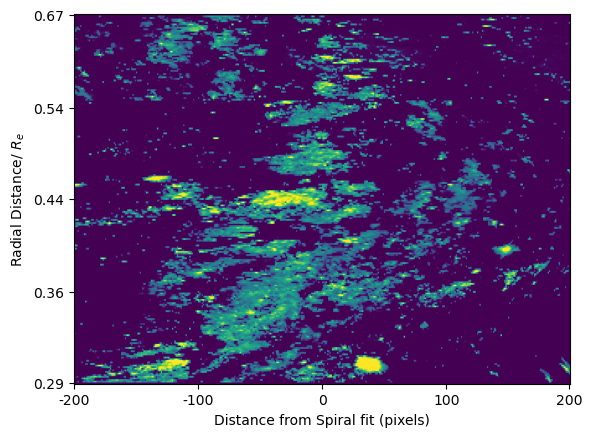

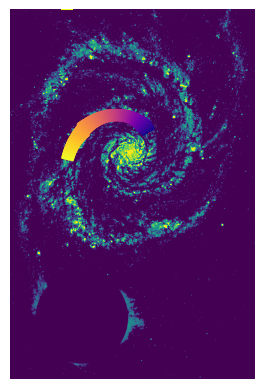

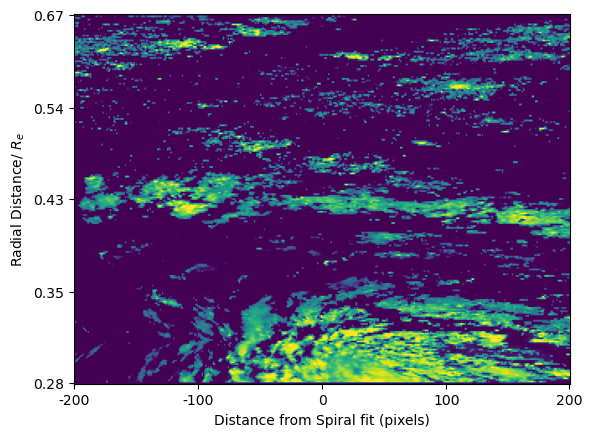

In [18]:

stacked_arm_1_I = gfits.Spiral_normal_distributions(M51_B_I,M51_B_Table,spir_points,int(len(x_trimmed)/2),200,True,False)

stacked_arm_2_I = gfits.Spiral_normal_distributions(M51_B_I,M51_B_Table,spir_points_2,int(len(x_trimmed)/2),200,True,False)

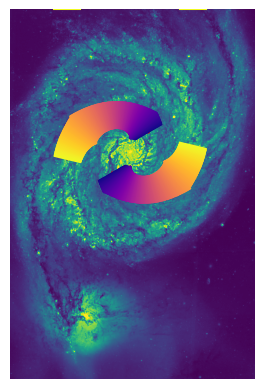

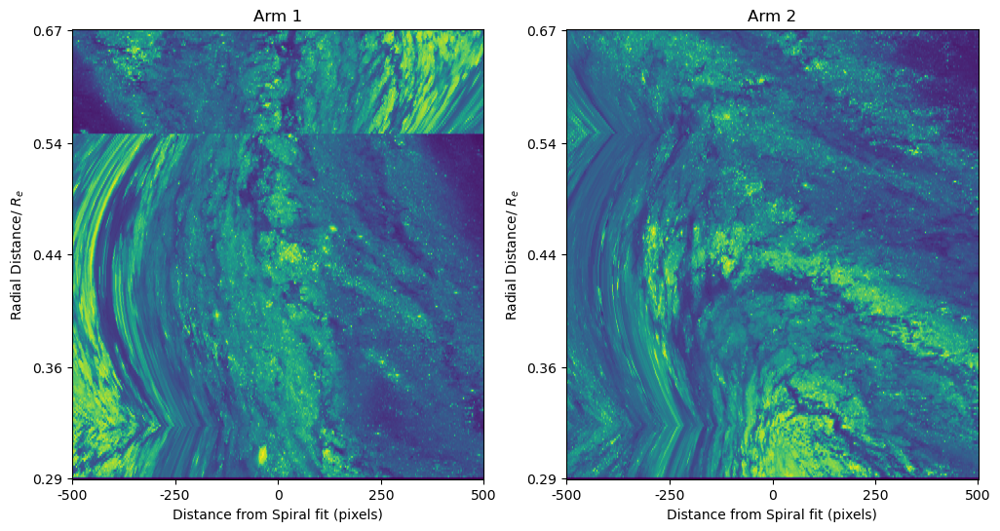

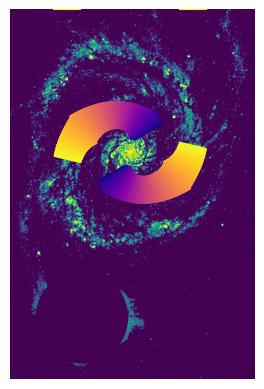

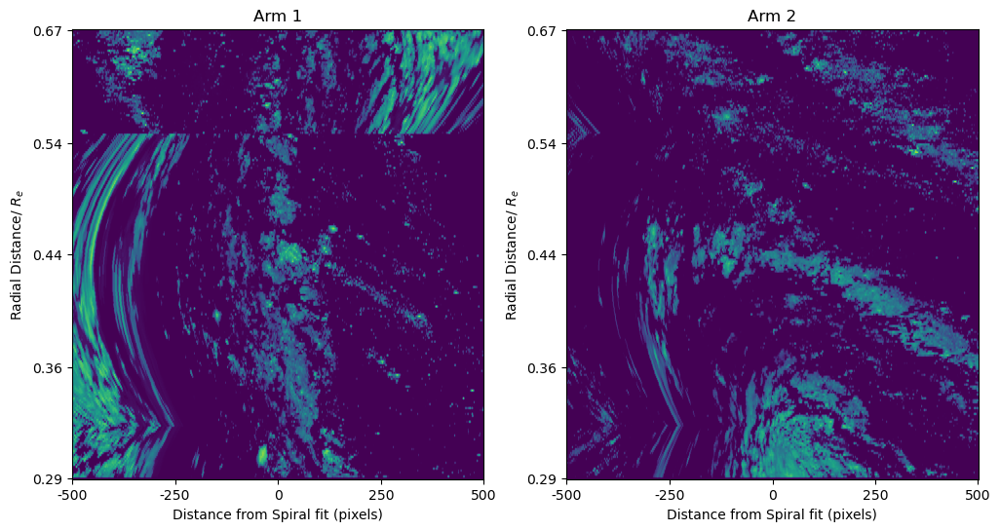

In [19]:
stacked_arm_1 = gfits.Spiral_normal_distributions(M51_B,M51_B_Table,spir_points,int(len(x_trimmed)/2),500,True,False,spiral_points2=spir_points_2)
stacked_arm_1_I = gfits.Spiral_normal_distributions(M51_B_I,M51_B_Table,spir_points,int(len(x_trimmed)/2),500,True,False,spiral_points2=spir_points_2)

In [20]:
# Want to work out where the discontinuity
x0 = M51_B_Table['x'] + M51_B.shape[1]/2
y0 = M51_B_Table['y'] + M51_B.shape[0]/2
R_e = 10**(M51_B_Table['log_re'])


m_array, c_array, tangent_points = gfits.get_normals(spir_points, int(len(x_trimmed)/2))

m_array2, c_array2, tangent_points2 = gfits.get_normals(spir_points_2, int(len(x_trimmed)/2))

radii_in_pixels = np.empty(len(tangent_points))
for i in range(0,len(tangent_points)):
    radii_in_pixels[i] =  np.sqrt((x0-tangent_points[i,0])**2+(y0-tangent_points[i,1])**2)
        
radii_in_pixels2 = np.empty(len(tangent_points2))
for i in range(0,len(tangent_points2)):
    radii_in_pixels2[i] =  np.sqrt((x0-tangent_points2[i,0])**2+(y0-tangent_points2[i,1])**2)


radii_in_R_e   =  radii_in_pixels/R_e
radii_in_R_e_2 =  radii_in_pixels2/R_e

radii_mask = np.logical_and(5.1 >= radii_in_R_e, radii_in_R_e >= 0.5)

# Get the indices where the mask is True
radii_mask = np.argwhere(radii_mask).flatten()

rad_in_question = radii_in_R_e[radii_mask]
m_in_question   = m_array[radii_mask]

comparisson = np.vstack([rad_in_question,m_in_question])
comparisson.T 

m_positive_mask = m_array > 0
m_positive_mask

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [21]:
stacked_arm_1_B = gfits.Spiral_normal_distributions(M51_B,M51_B_Table,spir_points,int(len(x_trimmed)/2),500,False,False)#,spiral_points2=spir_points_2)
stacked_arm_1_G = gfits.Spiral_normal_distributions(M51_G,M51_G_Table,spir_points,int(len(x_trimmed)/2),500,False,False)
stacked_arm_1_R = gfits.Spiral_normal_distributions(M51_R,M51_R_Table,spir_points,int(len(x_trimmed)/2),500,False,False)

stacked_arm_1_B_I = gfits.Spiral_normal_distributions(M51_B_I,M51_B_Table,spir_points,int(len(x_trimmed)/2),500,False,False)#,spiral_points2=spir_points_2)
stacked_arm_1_G_I = gfits.Spiral_normal_distributions(M51_G_I,M51_G_Table,spir_points,int(len(x_trimmed)/2),500,False,False)
stacked_arm_1_R_I = gfits.Spiral_normal_distributions(M51_R_I,M51_R_Table,spir_points,int(len(x_trimmed)/2),500,False,False)

In [22]:
# Make sure none are zero so that we don't have to interpolate
stacked_arm_1_B += 0.1
stacked_arm_1_G += 0.1
stacked_arm_1_R += 0.1

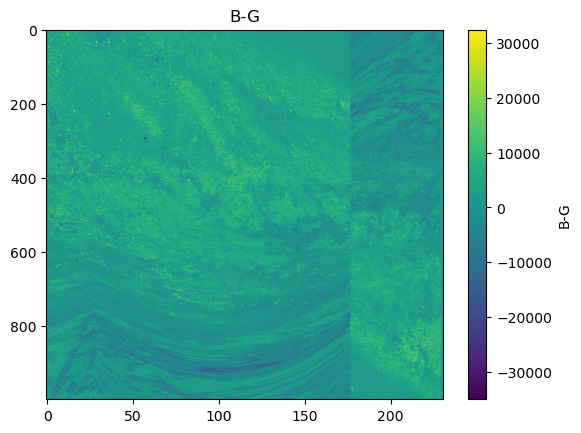

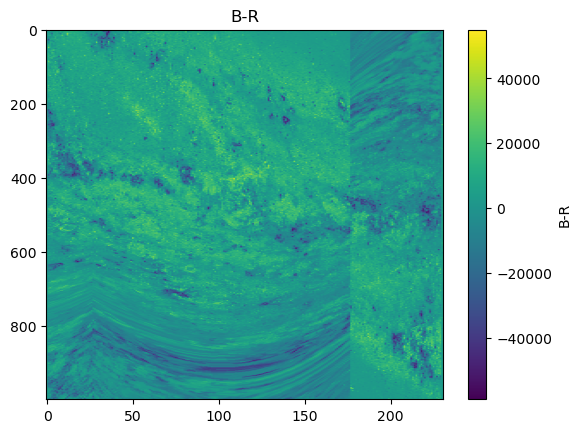

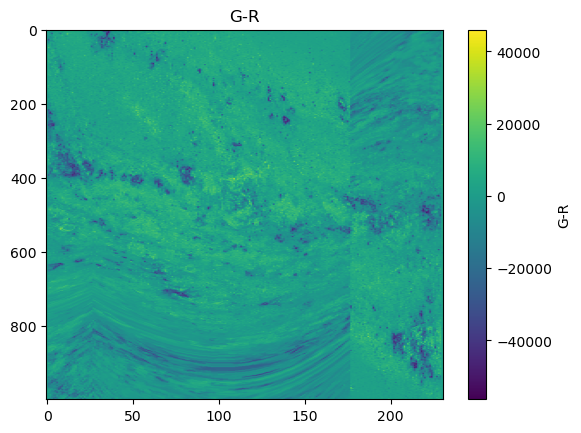

In [23]:
# Get colour image from the differnence between the two bands
stacked_arm_1_B_G = stacked_arm_1_B.T - stacked_arm_1_G.T
stacked_arm_1_B_R = stacked_arm_1_B.T - stacked_arm_1_R.T
stacked_arm_1_G_R = stacked_arm_1_G.T - stacked_arm_1_R.T

stacked_arm_1_B_div_G = -2.5*np.log10(stacked_arm_1_B.T / stacked_arm_1_G.T)
stacked_arm_1_B_div_R = -2.5*np.log10(stacked_arm_1_B.T / stacked_arm_1_R.T)
stacked_arm_1_G_div_R = -2.5*np.log10(stacked_arm_1_G.T / stacked_arm_1_R.T)

plt.figure()
plt.title('B-G')
plt.imshow(stacked_arm_1_B_G,aspect='auto')
plt.colorbar(label='B-G')

plt.figure()
plt.title('B-R')
plt.imshow(stacked_arm_1_B_R,aspect='auto')
plt.colorbar(label='B-R')

plt.figure()
plt.title('G-R')
plt.imshow(stacked_arm_1_G_R,aspect='auto')
plt.colorbar(label='G-R')

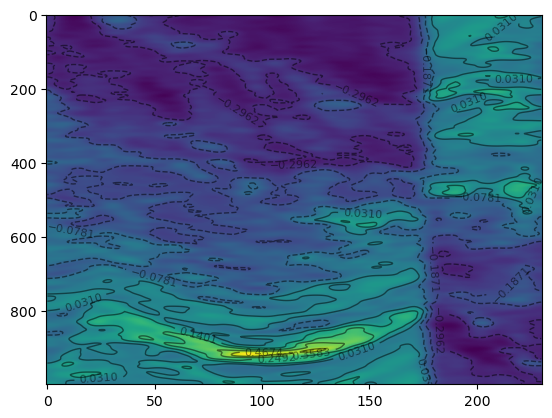

In [24]:
from scipy.ndimage import gaussian_filter
smoothed_image = gaussian_filter(stacked_arm_1_B_div_G, sigma=4) 
plt.imshow(smoothed_image,aspect='auto')
contour_levels = np.linspace(np.min(smoothed_image), np.max(smoothed_image), 10)  # Increase the number of contour levels
contours = plt.contour(smoothed_image, levels=contour_levels, colors='black', linewidths=1, alpha=0.5)
plt.clabel(contours, inline=True, fontsize=8)
plt.show()

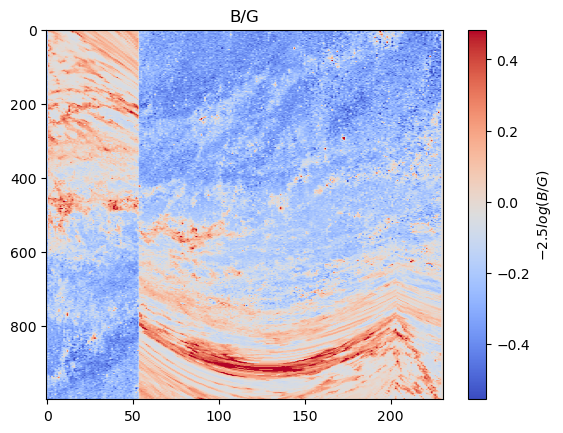

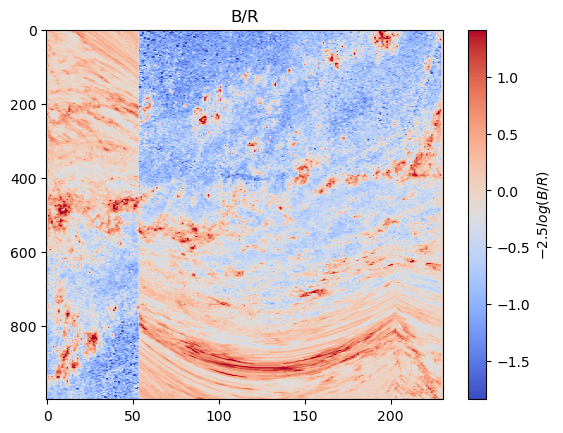

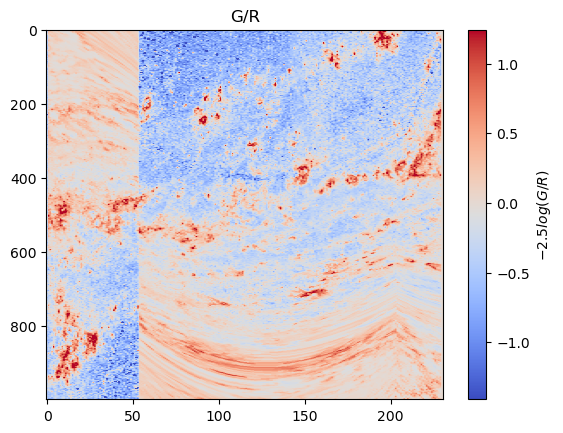

In [25]:

# First Need to sort out all of the div/0
from astropy.convolution.convolve import interpolate_replace_nans

# Create kernel
size = 101
stddev = 50
x, y = np.meshgrid(np.linspace(-size/2, size/2, size), np.linspace(-size/2, size/2, size))
kernel = np.exp(-(x**2 + y**2) / (2*stddev**2))
# Normalise kernel
kern = kernel/np.sum(kernel)

stacked_arm_1_B_div_G = interpolate_replace_nans(stacked_arm_1_B_div_G, kernel=kern)
stacked_arm_1_B_div_R_Z = interpolate_replace_nans(stacked_arm_1_B_div_R, kernel=kern)
stacked_arm_1_G_div_R = interpolate_replace_nans(stacked_arm_1_G_div_R, kernel=kern)

# Set contour parameters
N = 8

levels_B_G = np.linspace(stacked_arm_1_B_div_G.min(), stacked_arm_1_B_div_G.max(), num=N)
levels_B_R = np.linspace(stacked_arm_1_B_div_R.min(), stacked_arm_1_B_div_R.max(), num=N)
levels_G_R = np.linspace(stacked_arm_1_G_div_R.min(), stacked_arm_1_G_div_R.max(), num=N)

plt.figure()
plt.title('B/G')
minI,maxI = np.percentile(stacked_arm_1_B_div_G,(0.5,99.5))
plt.imshow(np.fliplr(stacked_arm_1_B_div_G),aspect='auto',vmin=minI,vmax=maxI,cmap='coolwarm')
plt.colorbar(label='$-2.5log(B/G)$')

#plt.contour(stacked_arm_1_B_div_G,colors='k',levels=levels_B_G,linewidths=0.5)

plt.figure()
plt.title('B/R')
minI,maxI = np.percentile(stacked_arm_1_B_div_R,(0.5,99.5))
plt.imshow(np.fliplr(stacked_arm_1_B_div_R),aspect='auto',vmin=minI,vmax=maxI,cmap='coolwarm')
plt.colorbar(label='$-2.5log(B/R)$')
#contours = plt.contour(smoothed_image, levels=contour_levels, colors='black', linewidths=1, alpha=0.5)
#plt.clabel(contours, inline=True, fontsize=8)
plt.show()

plt.figure()
plt.title('G/R')
minI,maxI = np.percentile(stacked_arm_1_G_div_R,(0.5,99.5))
plt.imshow(np.fliplr(stacked_arm_1_G_div_R),aspect='auto',vmin=minI,vmax=maxI,cmap='coolwarm')
plt.colorbar(label='$-2.5log(G/R)$')
#plt.contour(stacked_arm_1_G_div_R,colors='k',levels=levels_G_R,linewidths=0.5)

[   0  250  500  750 1000]


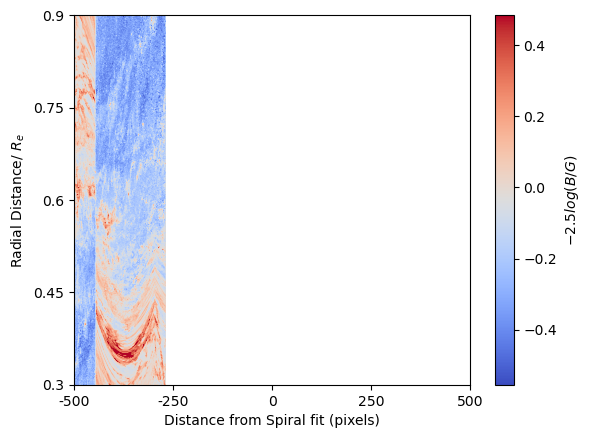

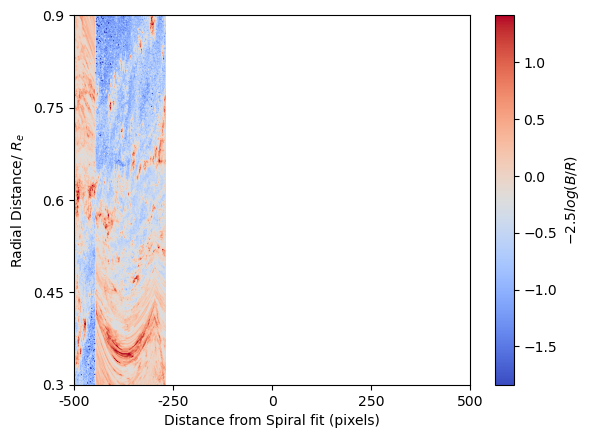

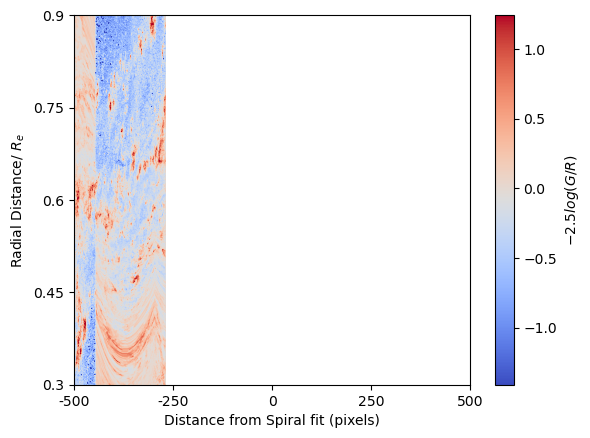

In [26]:
distance = np.linspace(0,1000,5).astype(int)
xticks = np.linspace(-500,500,5).astype(int)

y_tick_samples = np.linspace(0,stacked_arm_1_B_div_G.shape[0],5).astype(int)
print(y_tick_samples)
y_ticks = np.linspace(0.9,0.3,5)
y_tick_labels = np.array(['{}'.format(np.around(y_ticks[0],2)),
                            '{}'.format(np.around(y_ticks[1],2)),
                            '{}'.format(np.around(y_ticks[2],2)),
                            '{}'.format(np.around(y_ticks[3],2)),
                            '{}'.format(np.around(y_ticks[4],2))])

# Plotting


plt.figure()
#plt.title('B/G')
minI,maxI = np.percentile(stacked_arm_1_B_div_G,(0.5,99.5))
plt.imshow(np.fliplr(stacked_arm_1_B_div_G),aspect='auto',vmin=minI,vmax=maxI,cmap='coolwarm')
plt.xticks(distance,xticks)
plt.yticks(y_tick_samples,y_tick_labels)
plt.xlabel('Distance from Spiral fit (pixels)')
plt.ylabel('Radial Distance/ $R_e$ ')
plt.colorbar(label='$-2.5log(B/G)$')

plt.figure()
#plt.title('B/R')
minI,maxI = np.percentile(stacked_arm_1_B_div_R,(0.5,99.5))
plt.imshow(np.fliplr(stacked_arm_1_B_div_R),aspect='auto',vmin=minI,vmax=maxI,cmap='coolwarm')
plt.xticks(distance,xticks)
plt.yticks(y_tick_samples,y_tick_labels)
plt.xlabel('Distance from Spiral fit (pixels)')
plt.ylabel('Radial Distance/ $R_e$ ')
plt.colorbar(label='$-2.5log(B/R)$')


plt.figure()
#plt.title('G/R')
minI,maxI = np.percentile(stacked_arm_1_G_div_R,(0.5,99.5))
plt.imshow(np.fliplr(stacked_arm_1_G_div_R),aspect='auto',vmin=minI,vmax=maxI,cmap='coolwarm')
plt.xticks(distance,xticks)
plt.yticks(y_tick_samples,y_tick_labels)
plt.xlabel('Distance from Spiral fit (pixels)')
plt.ylabel('Radial Distance/ $R_e$ ')
plt.colorbar(label='$-2.5log(G/R)$')


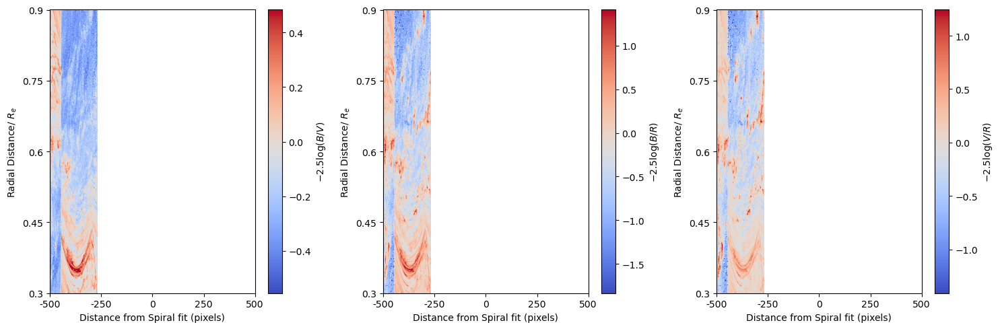

In [27]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# First subplot - B/G
minI,maxI = np.percentile(stacked_arm_1_B_div_G,(0.5,99.5))
im0 = axs[0].imshow(np.fliplr(stacked_arm_1_B_div_G), aspect='auto', vmin=minI, vmax=maxI, cmap='coolwarm')
axs[0].set_xticks(distance)
axs[0].set_yticks(y_tick_samples)
axs[0].set_xticklabels(xticks)
axs[0].set_yticklabels(y_tick_labels)
axs[0].set_xlabel('Distance from Spiral fit (pixels)')
axs[0].set_ylabel('Radial Distance/ $R_e$ ')
#axs[0].set_title('B/G')
axs[0].set_aspect('auto')
fig.colorbar(im0, ax=axs[0], label='$-2.5\log(B/V)$')

# Second subplot - B/R
minI,maxI = np.percentile(stacked_arm_1_B_div_R,(0.5,99.5))
im1 = axs[1].imshow(np.fliplr(stacked_arm_1_B_div_R), aspect='auto', vmin=minI, vmax=maxI, cmap='coolwarm')
axs[1].set_xticks(distance)
axs[1].set_yticks(y_tick_samples)
axs[1].set_xticklabels(xticks)
axs[1].set_yticklabels(y_tick_labels)
axs[1].set_xlabel('Distance from Spiral fit (pixels)')
axs[1].set_ylabel('Radial Distance/ $R_e$ ')
#axs[1].set_title('B/R')
axs[1].set_aspect('auto')
fig.colorbar(im1, ax=axs[1], label='$-2.5\log(B/R)$')

# Third subplot - G/R
minI,maxI = np.percentile(stacked_arm_1_G_div_R,(0.5,99.5))
im2 = axs[2].imshow(np.fliplr(stacked_arm_1_G_div_R), aspect='auto', vmin=minI, vmax=maxI, cmap='coolwarm')
axs[2].set_xticks(distance)
axs[2].set_yticks(y_tick_samples)
axs[2].set_xticklabels(xticks)
axs[2].set_yticklabels(y_tick_labels)
axs[2].set_xlabel('Distance from Spiral fit (pixels)')
axs[2].set_ylabel('Radial Distance/ $R_e$ ')
#axs[2].set_title('G/R')
axs[2].set_aspect('auto')
fig.colorbar(im2, ax=axs[2], label='$-2.5\log(V/R)$')

plt.tight_layout()
plt.show()


In [28]:
# Avereage the colour over radius:
B_R_colour_avg_radius = np.average(stacked_arm_1_B_G.T)

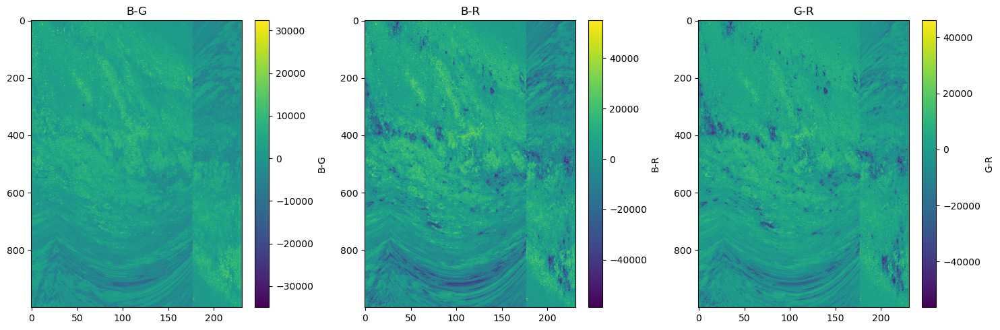

In [29]:

# Create a 1x3 subplot grid
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Subplot 1: B-G
axes[0].set_title('B-G')
im1 = axes[0].imshow(stacked_arm_1_B_G, aspect='auto')
fig.colorbar(im1, ax=axes[0], label='B-G')

# Subplot 2: B-R
axes[1].set_title('B-R')
im2 = axes[1].imshow(stacked_arm_1_B_R, aspect='auto')
fig.colorbar(im2, ax=axes[1], label='B-R')

# Subplot 3: G-R
axes[2].set_title('G-R')
im3 = axes[2].imshow(stacked_arm_1_G_R, aspect='auto')
fig.colorbar(im3, ax=axes[2], label='G-R')

# Adjust spacing between subplots
fig.tight_layout()

# Display the plot
plt.show()

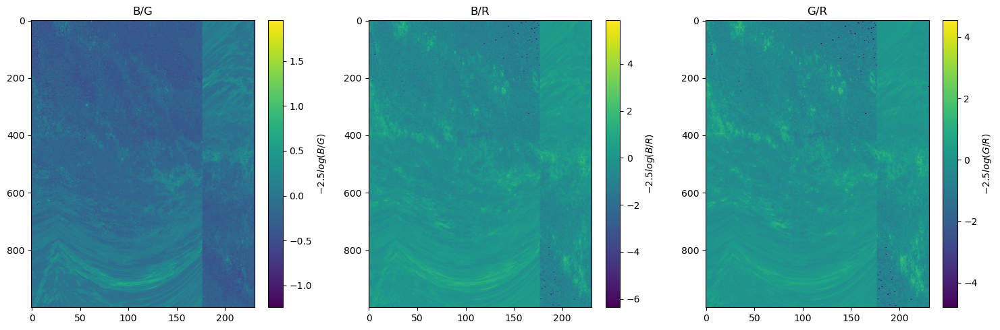

In [30]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

im1 = axs[0].imshow(stacked_arm_1_B_div_G, aspect='auto')
axs[0].set_title('B/G')
fig.colorbar(im1, ax=axs[0], label='$-2.5log(B/G)$')

im2 = axs[1].imshow(stacked_arm_1_B_div_R, aspect='auto',
                    vmin=np.mean(stacked_arm_1_B_div_R)-10*np.std(stacked_arm_1_B_div_R),
                    vmax=np.mean(stacked_arm_1_B_div_R)+10*np.std(stacked_arm_1_B_div_R))
axs[1].set_title('B/R')
fig.colorbar(im2, ax=axs[1], label='$-2.5log(B/R)$')

im3 = axs[2].imshow(stacked_arm_1_G_div_R, aspect='auto',
                    vmin=np.mean(stacked_arm_1_G_div_R)-10*np.std(stacked_arm_1_G_div_R),
                    vmax=np.mean(stacked_arm_1_G_div_R)+10*np.std(stacked_arm_1_G_div_R))
axs[2].set_title('G/R')
fig.colorbar(im3, ax=axs[2], label='$-2.5log(G/R)$')

plt.tight_layout()
plt.show()


ValueError: x and y must have same first dimension, but have shapes (1000,) and (231,)

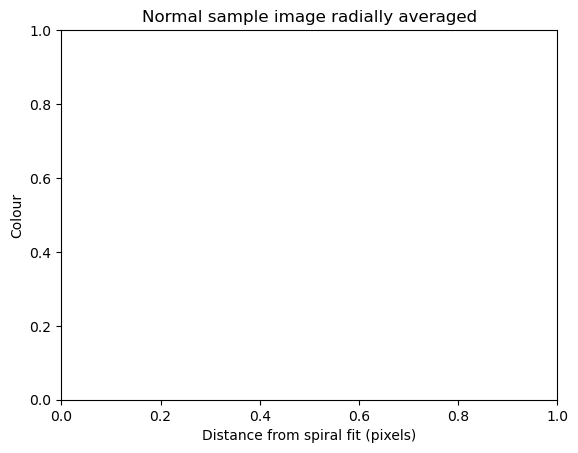

In [31]:
# Create average plots again as they seem to have gone missing

# Set arm width
half_arm_width = 120

# Create array of distance_to_fit
distance_to_fit = np.linspace(500,-500,1000)

# Calculate Averages
B_G_colour_avg_radii = np.average(stacked_arm_1_B_G.T,axis=1)
B_R_colour_avg_radii = np.average(stacked_arm_1_B_R.T,axis=1)
G_R_colour_avg_radii = np.average(stacked_arm_1_G_R.T,axis=1)

# Plot
plt.figure()
plt.title('Normal sample image radially averaged')
plt.ylabel('Colour')
plt.xlabel('Distance from spiral fit (pixels)')
plt.plot(distance_to_fit,B_G_colour_avg_radii)
plt.plot(distance_to_fit,B_R_colour_avg_radii)
plt.plot(distance_to_fit,G_R_colour_avg_radii)
plt.legend(['B-G','B-R','G-R'])
plt.xlim(-half_arm_width,half_arm_width)
plt.ylim(np.min(G_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])-200,
         np.max(B_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])+200)



(-0.4181337487169587, 0.1774624427605495)

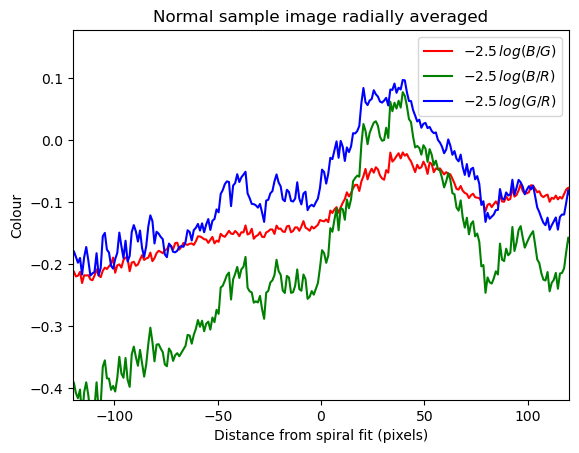

In [ ]:
# Now do the same but with -2.5log(band1/band2)

# Create average plots again as they seem to have gone missing

# Set arm width
half_arm_width = 120

# Create array of distance_to_fit
distance_to_fit = np.linspace(-500,500,1000)

# Calculate Averages
B_G_colour_avg_radii = np.average(stacked_arm_1_B_div_G.T,axis=1)
B_R_colour_avg_radii = np.average(stacked_arm_1_B_div_R.T,axis=1)
G_R_colour_avg_radii = np.average(stacked_arm_1_G_div_R.T,axis=1)

# Calculate Uncertainty by measuring the standard deviation of the intensity at 
B_G_colour_std_radii = np.std(stacked_arm_1_B_div_G.T,axis=1)
B_R_colour_std_radii = np.std(stacked_arm_1_B_div_R.T,axis=1)
G_R_colour_std_radii = np.std(stacked_arm_1_G_div_R.T,axis=1)

# Plot
plt.figure()
plt.title('Normal sample image radially averaged')
plt.ylabel('Colour')
plt.xlabel('Distance from spiral fit (pixels)')

plt.plot(distance_to_fit,B_G_colour_avg_radii,'r')
#plt.fill_between(distance_to_fit, B_G_colour_avg_radii - B_G_colour_std_radii, B_G_colour_avg_radii + B_G_colour_std_radii, alpha=0.2, color='red')

plt.plot(distance_to_fit,B_R_colour_avg_radii,'g')
#plt.fill_between(distance_to_fit, B_R_colour_avg_radii - B_R_colour_std_radii, B_R_colour_avg_radii + B_R_colour_std_radii, alpha=0.2, color='green')

plt.plot(distance_to_fit,G_R_colour_avg_radii,'b')
#plt.fill_between(distance_to_fit, G_R_colour_avg_radii - G_R_colour_std_radii, G_R_colour_avg_radii + G_R_colour_std_radii, alpha=0.2, color='blue')

plt.legend(['$-2.5\, log(B/G)$','$-2.5\, log(B/R)$','$-2.5\, log(G/R)$'])
plt.xlim(-half_arm_width,half_arm_width)
plt.ylim(np.min(G_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])-0.2,
         np.max(B_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])+0.1)




(-0.4181337487169587, 0.1774624427605495)

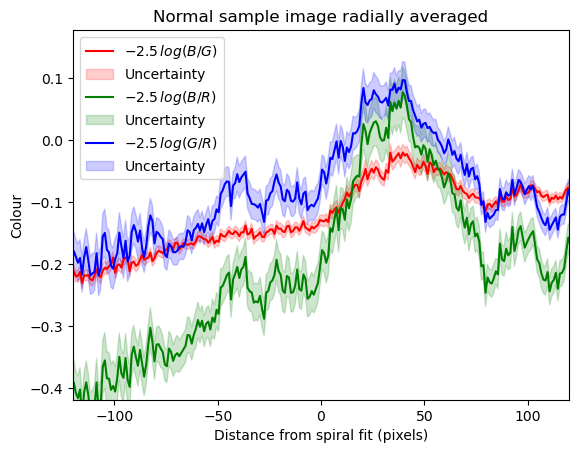

In [ ]:
# Plot
plt.figure()
plt.title('Normal sample image radially averaged')
plt.ylabel('Colour')
plt.xlabel('Distance from spiral fit (pixels)')

plt.plot(distance_to_fit,B_G_colour_avg_radii,'r')
plt.fill_between(distance_to_fit, B_G_colour_avg_radii - (B_G_colour_std_radii/np.sqrt(stacked_arm_1_B_div_G.shape[0])), B_G_colour_avg_radii + (B_G_colour_std_radii/np.sqrt(stacked_arm_1_B_div_G.shape[0])), alpha=0.2, color='red')

plt.plot(distance_to_fit,B_R_colour_avg_radii,'g')
plt.fill_between(distance_to_fit, B_R_colour_avg_radii - (B_R_colour_std_radii/np.sqrt(stacked_arm_1_B_div_R.shape[0])), B_R_colour_avg_radii + (B_R_colour_std_radii/np.sqrt(stacked_arm_1_B_div_R.shape[0])), alpha=0.2, color='green')

plt.plot(distance_to_fit,G_R_colour_avg_radii,'b')
plt.fill_between(distance_to_fit, G_R_colour_avg_radii - (G_R_colour_std_radii/np.sqrt(stacked_arm_1_G_div_R.shape[0])), G_R_colour_avg_radii + (G_R_colour_std_radii/np.sqrt(stacked_arm_1_G_div_R.shape[0])), alpha=0.2, color='blue')

plt.legend(['$-2.5\, log(B/G)$','Uncertainty','$-2.5\, log(B/R)$','Uncertainty','$-2.5\, log(G/R)$','Uncertainty'])
plt.xlim(-half_arm_width,half_arm_width)
plt.ylim(np.min(G_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])-0.2,
         np.max(B_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])+0.1)



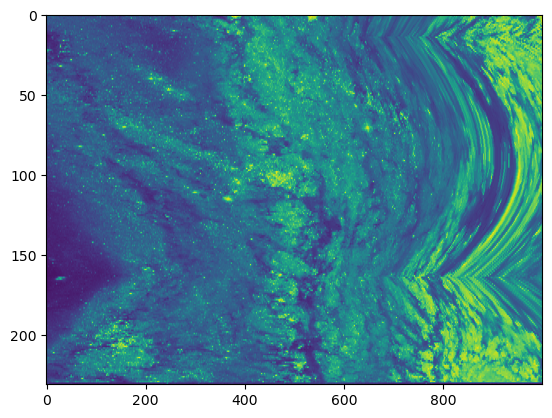

In [ ]:
# have a look and check
plt.imshow(stacked_arm_1_B.T,aspect='auto')

(-120.0, 120.0)

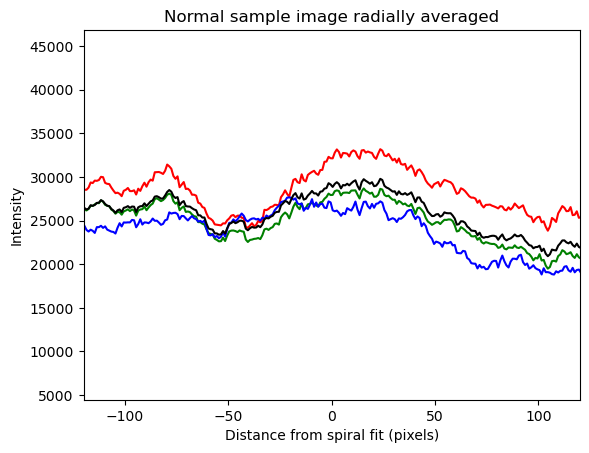

In [ ]:
# Now wish to examine the intensity averaged in the same way
# Calculate Averages
B_intensity_avg_radii = np.average(stacked_arm_1_B,axis=1)
G_intensity_avg_radii = np.average(stacked_arm_1_G,axis=1)
R_intensity_avg_radii = np.average(stacked_arm_1_R,axis=1)

Average_intensity = np.sqrt((B_intensity_avg_radii**2 + G_intensity_avg_radii**2 + R_intensity_avg_radii**2)/3)

# Calculate Uncertainty by measuring the standard deviation of the intensity at 
B_intensity_std_radii = np.std(stacked_arm_1_B,axis=1)
G_intensity_std_radii = np.std(stacked_arm_1_G,axis=1)
R_intensity_std_radii = np.std(stacked_arm_1_R,axis=1)


plt.figure()
plt.title('Normal sample image radially averaged')
plt.ylabel('Intensity')
plt.xlabel('Distance from spiral fit (pixels)')

plt.plot(-1*distance_to_fit,B_intensity_avg_radii,'r')
#plt.fill_between(distance_to_fit, B_G_colour_avg_radii - (B_G_colour_std_radii/np.sqrt(stacked_arm_1_B_div_G.shape[0])), B_G_colour_avg_radii + (B_G_colour_std_radii/np.sqrt(stacked_arm_1_B_div_G.shape[0])), alpha=0.2, color='red')

plt.plot(-1*distance_to_fit,G_intensity_avg_radii,'g')
#plt.fill_between(distance_to_fit, B_R_colour_avg_radii - (B_R_colour_std_radii/np.sqrt(stacked_arm_1_B_div_R.shape[0])), B_R_colour_avg_radii + (B_R_colour_std_radii/np.sqrt(stacked_arm_1_B_div_R.shape[0])), alpha=0.2, color='green')

plt.plot(-1*distance_to_fit,R_intensity_avg_radii,'b')
#plt.fill_between(distance_to_fit, G_R_colour_avg_radii - (G_R_colour_std_radii/np.sqrt(stacked_arm_1_G_div_R.shape[0])), G_R_colour_avg_radii + (G_R_colour_std_radii/np.sqrt(stacked_arm_1_G_div_R.shape[0])), alpha=0.2, color='blue')

plt.plot(-1*distance_to_fit,Average_intensity,'k')

#plt.legend(['$-2.5\, log(B/G)$','Uncertainty','$-2.5\, log(B/R)$','Uncertainty','$-2.5\, log(G/R)$','Uncertainty'])
plt.xlim(-half_arm_width,half_arm_width)
#plt.ylim(np.min(G_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])-0.2,
         #np.max(B_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])+0.1)


In [ ]:
# In this fit we decide to use the standard deviation of the intensity of the pixels calculated radially as we believe it 
# would make a bigger contribution to uncertainty than propagating the error on the pixels using the poisson method and 
# propagating for colour calculation



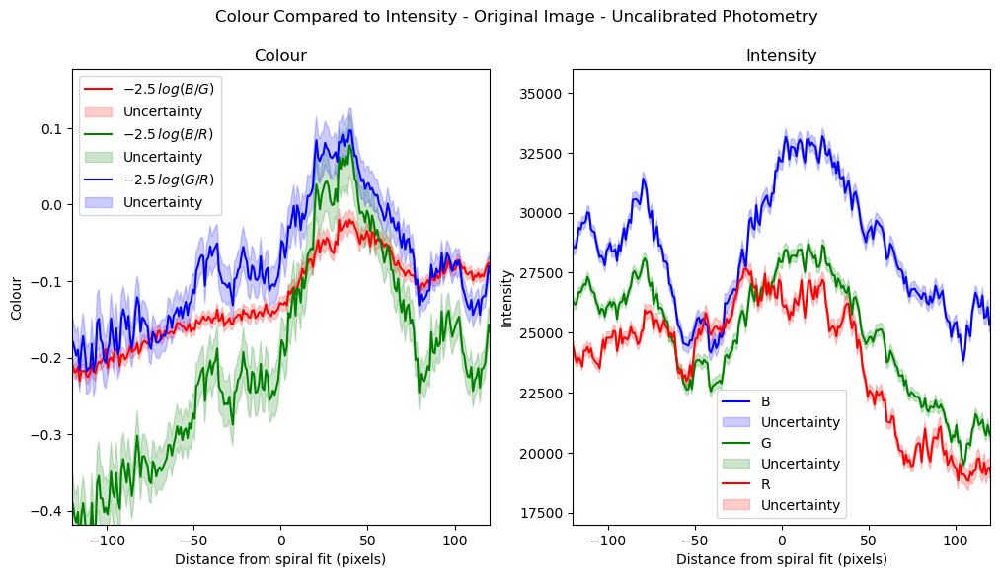

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

fig.suptitle('Colour Compared to Intensity - Original Image - Uncalibrated Photometry')

axs[0].set_title('Colour')
axs[0].set_ylabel('Colour')
axs[0].set_xlabel('Distance from spiral fit (pixels)')

axs[0].plot(distance_to_fit,B_G_colour_avg_radii,'r')
axs[0].fill_between(distance_to_fit, B_G_colour_avg_radii - (B_G_colour_std_radii/np.sqrt(stacked_arm_1_B_div_G.shape[0])), B_G_colour_avg_radii + (B_G_colour_std_radii/np.sqrt(stacked_arm_1_B_div_G.shape[0])), alpha=0.2, color='red')

axs[0].plot(distance_to_fit,B_R_colour_avg_radii,'g')
axs[0].fill_between(distance_to_fit, B_R_colour_avg_radii - (B_R_colour_std_radii/np.sqrt(stacked_arm_1_B_div_R.shape[0])), B_R_colour_avg_radii + (B_R_colour_std_radii/np.sqrt(stacked_arm_1_B_div_R.shape[0])), alpha=0.2, color='green')

axs[0].plot(distance_to_fit,G_R_colour_avg_radii,'b')
axs[0].fill_between(distance_to_fit, G_R_colour_avg_radii - (G_R_colour_std_radii/np.sqrt(stacked_arm_1_G_div_R.shape[0])), G_R_colour_avg_radii + (G_R_colour_std_radii/np.sqrt(stacked_arm_1_G_div_R.shape[0])), alpha=0.2, color='blue')

axs[0].legend(['$-2.5\, log(B/G)$','Uncertainty','$-2.5\, log(B/R)$','Uncertainty','$-2.5\, log(G/R)$','Uncertainty'])
axs[0].set_xlim(-half_arm_width,half_arm_width)
axs[0].set_ylim(np.min(G_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])-0.2,
         np.max(B_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])+0.1)

axs[1].set_title('Intensity')
axs[1].set_ylabel('Intensity')
axs[1].set_xlabel('Distance from spiral fit (pixels)')

axs[1].plot(-1*distance_to_fit,B_intensity_avg_radii,'b')
axs[1].fill_between(-1*distance_to_fit, B_intensity_avg_radii - (B_intensity_std_radii/np.sqrt(B_intensity_std_radii.shape[0])), B_intensity_avg_radii + (B_intensity_std_radii/np.sqrt(B_intensity_std_radii.shape[0])), alpha=0.2, color='blue')

axs[1].plot(-1*distance_to_fit,G_intensity_avg_radii,'g')
axs[1].fill_between(-1*distance_to_fit, G_intensity_avg_radii - (G_intensity_std_radii/np.sqrt(G_intensity_std_radii.shape[0])), G_intensity_avg_radii + (G_intensity_std_radii/np.sqrt(G_intensity_std_radii.shape[0])), alpha=0.2, color='green')

axs[1].plot(-1*distance_to_fit,R_intensity_avg_radii,'r')
axs[1].fill_between(-1*distance_to_fit, R_intensity_avg_radii - (R_intensity_std_radii/np.sqrt(R_intensity_std_radii.shape[0])), R_intensity_avg_radii + (R_intensity_std_radii/np.sqrt(R_intensity_std_radii.shape[0])), alpha=0.2, color='red')

#axs[1].plot(-1*distance_to_fit,Average_intensity,'k')

axs[1].set_xlim(-half_arm_width,half_arm_width)
axs[1].set_ylim(17000,36000)
axs[1].legend(['B','Uncertainty','G','Uncertainty','R','Uncertainty'])

plt.show()


In [ ]:
# Now want to compare the trace of the isolated images - Uncalibrated

# Colour
#-------

# Generate colours
stacked_arm_1_B_div_G_I = -2.5*np.log10(stacked_arm_1_B_I.T / stacked_arm_1_G_I.T)
stacked_arm_1_B_div_R_I = -2.5*np.log10(stacked_arm_1_B_I.T / stacked_arm_1_R_I.T)
stacked_arm_1_G_div_R_I = -2.5*np.log10(stacked_arm_1_G_I.T / stacked_arm_1_R_I.T)

#=================================================================================
# Wish to fix any nans and infs to zero in images

# Nans
stacked_arm_1_B_div_G_I[np.isnan(stacked_arm_1_B_div_G_I)] = 0.0

stacked_arm_1_B_div_R_I[np.isnan(stacked_arm_1_B_div_R_I)] = 0.0

stacked_arm_1_G_div_R_I[np.isnan(stacked_arm_1_G_div_R_I)] = 0.0

# Infs

stacked_arm_1_B_div_G_I[np.isinf(stacked_arm_1_B_div_G_I)] = 0.0

stacked_arm_1_B_div_R_I[np.isinf(stacked_arm_1_B_div_R_I)] = 0.0

stacked_arm_1_G_div_R_I[np.isinf(stacked_arm_1_G_div_R_I)] = 0.0


#=================================================================================

# Calculate Averages
B_G_colour_avg_radii_I = np.average(stacked_arm_1_B_div_G_I.T,axis=1)
B_R_colour_avg_radii_I = np.average(stacked_arm_1_B_div_R_I.T,axis=1)
G_R_colour_avg_radii_I = np.average(stacked_arm_1_G_div_R_I.T,axis=1)

# Calculate Uncertainty by measuring the standard deviation of the intensity at distance from fit
B_G_colour_std_radii_I = np.std(stacked_arm_1_B_div_G_I.T,axis=1)
B_R_colour_std_radii_I = np.std(stacked_arm_1_B_div_R_I.T,axis=1)
G_R_colour_std_radii_I = np.std(stacked_arm_1_G_div_R_I.T,axis=1)

# Intensity
#----------

# Calculate Averages
B_intensity_avg_radii_I = np.average(stacked_arm_1_B_I,axis=1)
G_intensity_avg_radii_I = np.average(stacked_arm_1_G_I,axis=1)
R_intensity_avg_radii_I = np.average(stacked_arm_1_R_I,axis=1)

Average_intensity = np.sqrt((B_intensity_avg_radii_I**2 + G_intensity_avg_radii_I**2 + R_intensity_avg_radii_I**2)/3)

# Calculate Uncertainty by measuring the standard deviation of the intensity at distance from fit
B_intensity_std_radii_I = np.std(stacked_arm_1_B_I,axis=1)
G_intensity_std_radii_I = np.std(stacked_arm_1_G_I,axis=1)
R_intensity_std_radii_I = np.std(stacked_arm_1_R_I,axis=1)



/tmp/ipykernel_384/2847045831.py:7: RuntimeWarning: divide by zero encountered in divide
  stacked_arm_1_B_div_G_I = -2.5*np.log10(stacked_arm_1_B_I.T / stacked_arm_1_G_I.T)
/tmp/ipykernel_384/2847045831.py:7: RuntimeWarning: invalid value encountered in divide
  stacked_arm_1_B_div_G_I = -2.5*np.log10(stacked_arm_1_B_I.T / stacked_arm_1_G_I.T)
/tmp/ipykernel_384/2847045831.py:7: RuntimeWarning: divide by zero encountered in log10
  stacked_arm_1_B_div_G_I = -2.5*np.log10(stacked_arm_1_B_I.T / stacked_arm_1_G_I.T)
/tmp/ipykernel_384/2847045831.py:8: RuntimeWarning: divide by zero encountered in divide
  stacked_arm_1_B_div_R_I = -2.5*np.log10(stacked_arm_1_B_I.T / stacked_arm_1_R_I.T)
/tmp/ipykernel_384/2847045831.py:8: RuntimeWarning: invalid value encountered in divide
  stacked_arm_1_B_div_R_I = -2.5*np.log10(stacked_arm_1_B_I.T / stacked_arm_1_R_I.T)
/tmp/ipykernel_384/2847045831.py:8: RuntimeWarning: divide by zero encountered in log10
  stacked_arm_1_B_div_R_I = -2.5*np.log10(sta

IndexError: arrays used as indices must be of integer (or boolean) type

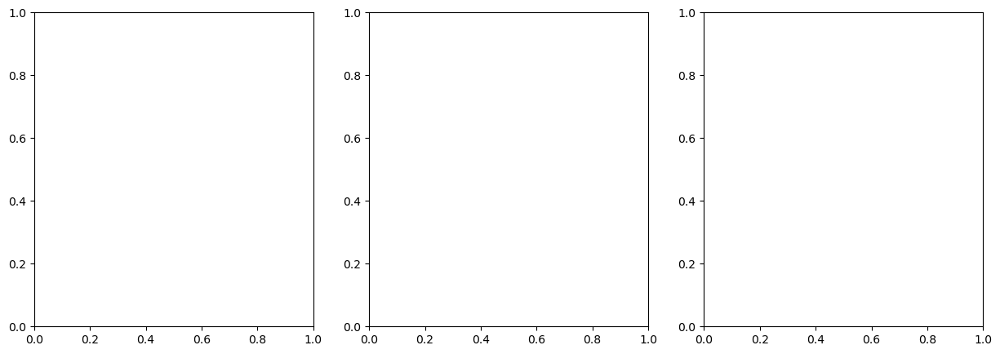

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

distance_to_fit = np.linspace(500,-500,1000)
xticks = distance_to_fit[np.linspace(0,len(distance_to_fit),4)]

im1 = axs[0].imshow(np.fliplr(stacked_arm_1_B_div_G_I), aspect='auto')
axs[0].set_title('B/G')
fig.colorbar(im1, ax=axs[0], label='$-2.5log(B/G)$')

im2 = axs[1].imshow(np.fliplr(stacked_arm_1_B_div_R_I), aspect='auto')#,
                    #vmin=np.mean(stacked_arm_1_B_div_R_I)-10*np.std(stacked_arm_1_B_div_R_I),
                    #vmax=np.mean(stacked_arm_1_B_div_R_I)+10*np.std(stacked_arm_1_B_div_R_I))
axs[1].set_title('B/R')
fig.colorbar(im2, ax=axs[1], label='$-2.5log(B/R)$')

im3 = axs[2].imshow(np.fliplr(stacked_arm_1_G_div_R_I), aspect='auto')#,
                    #vmin=np.mean(stacked_arm_1_G_div_R_I)-10*np.std(stacked_arm_1_G_div_R_I),
                    #vmax=np.mean(stacked_arm_1_G_div_R_I)+10*np.std(stacked_arm_1_G_div_R_I))
axs[2].set_title('G/R')
fig.colorbar(im3, ax=axs[2], label='$-2.5log(G/R)$')

plt.tight_layout()
plt.show()


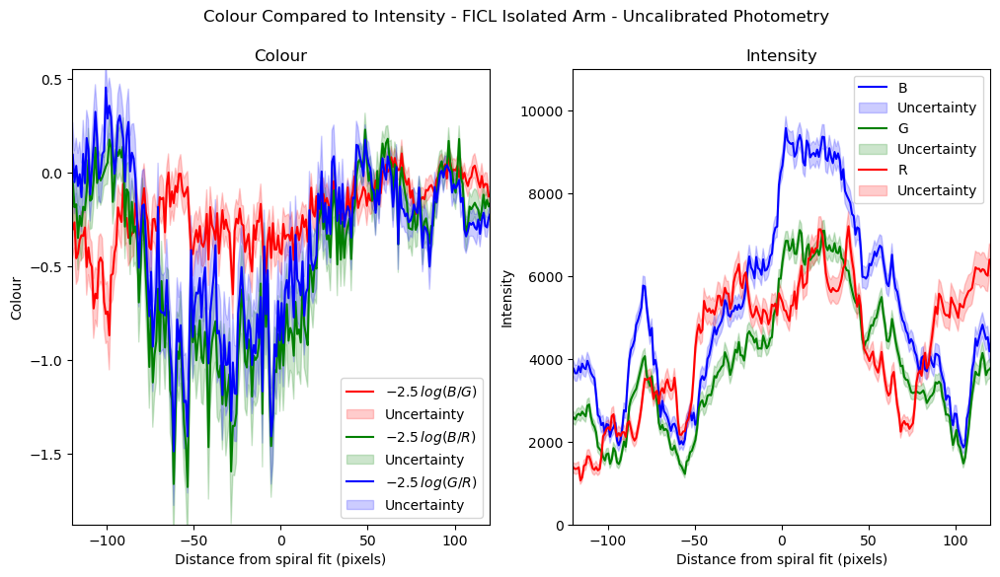

In [ ]:
# Plotting Isolated:

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

fig.suptitle('Colour Compared to Intensity - FICL Isolated Arm - Uncalibrated Photometry')

axs[0].set_title('Colour')
axs[0].set_ylabel('Colour')
axs[0].set_xlabel('Distance from spiral fit (pixels)')

axs[0].plot(distance_to_fit,B_G_colour_avg_radii_I,'r')
axs[0].fill_between(distance_to_fit, B_G_colour_avg_radii_I - (B_G_colour_std_radii_I/np.sqrt(stacked_arm_1_B_div_G_I.shape[0])), B_G_colour_avg_radii_I + (B_G_colour_std_radii_I/np.sqrt(stacked_arm_1_B_div_G.shape[0])), alpha=0.2, color='red')

axs[0].plot(distance_to_fit,B_R_colour_avg_radii_I,'g')
axs[0].fill_between(distance_to_fit, B_R_colour_avg_radii_I - (B_R_colour_std_radii_I/np.sqrt(stacked_arm_1_B_div_R_I.shape[0])), B_R_colour_avg_radii_I + (B_R_colour_std_radii_I/np.sqrt(stacked_arm_1_B_div_R.shape[0])), alpha=0.2, color='green')

axs[0].plot(distance_to_fit,G_R_colour_avg_radii_I,'b')
axs[0].fill_between(distance_to_fit, G_R_colour_avg_radii_I - (G_R_colour_std_radii_I/np.sqrt(stacked_arm_1_G_div_R_I.shape[0])), G_R_colour_avg_radii_I + (G_R_colour_std_radii_I/np.sqrt(stacked_arm_1_G_div_R.shape[0])), alpha=0.2, color='blue')

axs[0].legend(['$-2.5\, log(B/G)$','Uncertainty','$-2.5\, log(B/R)$','Uncertainty','$-2.5\, log(G/R)$','Uncertainty'])
axs[0].set_xlim(-half_arm_width,half_arm_width)
axs[0].set_ylim(np.min(B_R_colour_avg_radii_I[(500-half_arm_width):(500+half_arm_width)])-0.2,
         np.max(G_R_colour_avg_radii_I[(500-half_arm_width):(500+half_arm_width)])+0.1)

axs[1].set_title('Intensity')
axs[1].set_ylabel('Intensity')
axs[1].set_xlabel('Distance from spiral fit (pixels)')

axs[1].plot(-1*distance_to_fit,B_intensity_avg_radii_I,'b')
axs[1].fill_between(-1*distance_to_fit, B_intensity_avg_radii_I - (B_intensity_std_radii_I/np.sqrt(B_intensity_std_radii_I.shape[0])), B_intensity_avg_radii_I + (B_intensity_std_radii_I/np.sqrt(B_intensity_std_radii_I.shape[0])), alpha=0.2, color='blue')

axs[1].plot(-1*distance_to_fit,G_intensity_avg_radii_I,'g')
axs[1].fill_between(-1*distance_to_fit, G_intensity_avg_radii_I - (G_intensity_std_radii_I/np.sqrt(G_intensity_std_radii_I.shape[0])), G_intensity_avg_radii_I + (G_intensity_std_radii_I/np.sqrt(G_intensity_std_radii_I.shape[0])), alpha=0.2, color='green')

axs[1].plot(-1*distance_to_fit,R_intensity_avg_radii_I,'r')
axs[1].fill_between(-1*distance_to_fit, R_intensity_avg_radii_I - (R_intensity_std_radii_I/np.sqrt(R_intensity_std_radii_I.shape[0])), R_intensity_avg_radii_I + (R_intensity_std_radii_I/np.sqrt(R_intensity_std_radii_I.shape[0])), alpha=0.2, color='red')

#axs[1].plot(-1*distance_to_fit,Average_intensity,'k')

axs[1].set_xlim(-half_arm_width,half_arm_width)
axs[1].set_ylim(0,11000)
axs[1].legend(['B','Uncertainty','G','Uncertainty','R','Uncertainty'])

plt.show()

In [ ]:
# Need to calibrate the flux using the zero points

# First need to get the Pixel size in arcseconds from the header of the fits files

fits_path = '/home/borge/Data/Case_studies/M51/m51_optical_B.fits'
# Open Fits File and get the arcsec per pixel
hdul = fits.open(fits_path)

fits_info = {}  # Create dictionary for header info
for key, value in hdul[0].header.items():
    fits_info[key] = value

# Retreive Pixel conversion factors
CD1_1 = fits_info['CD1_1'] *3600 # Convert to arcseconds
CD2_2 = fits_info['CD2_2'] *3600

D_pix = np.mean([np.abs(CD1_1),np.abs(CD2_2)])

# Cool so make this into a function to save some time later

def Arcsec_per_pixel(fits_path):
    hdul = fits.open(fits_path)

    fits_info = {}  # Create dictionary for header info
    for key, value in hdul[0].header.items():
        fits_info[key] = value

    # Retreive Pixel conversion factors
    CD1_1 = fits_info['CD1_1'] *3600 # Convert to arcseconds
    CD2_2 = fits_info['CD2_2'] *3600
    
    # Average X and Y transformation indices
    D_pix = np.mean([np.abs(CD1_1),np.abs(CD2_2)])
    
    return D_pix


In [ ]:
print(Arcsec_per_pixel('/home/borge/Data/Case_studies/M51/m51_optical_B.fits'))

0.16001348142783223


In [ ]:
c = 299792458
# Now need the width of the wavelength bandpass in angstroms
#B band: Central wavelength = 4350 Å, Bandwidth = 1030 Å
#G band: Central wavelength = 4750 Å, Bandwidth = 1400 Å
#R band: Central wavelength = 6250 Å, Bandwidth = 1700 Å

B_centre = 4350
B_width = 1030
B_QE = 0.68
B_Gain = 1.97
B_zero_point = 4270 # Janskys

G_centre = 4750
G_width = 1400
G_QE = 0.58
G_Gain = 1.73
G_zero_point = 3610 # Janskys

R_centre = 6250
R_width = 1700
R_QE = 0.61
R_Gain = 1.74
R_zero_point = 2840 # Janskys

def Flux_density(flux,band_width,D_pix):
    flux_density = flux/(D_pix**2 * band_width)
    return flux_density

def Counts_to_photons(counts,gain,QE):
    photons = (counts*gain)/QE
    return photons

N = 1000

N_photons = Counts_to_photons(N,R_Gain,R_QE)

collecting_area = 4 #m^2

exposure_time = 600 # seconds

def Energy_of_photon(wav,Angstrom=True): # give the wavelength in meters
    h = 6.62607015e-34
    c = 299792458
    if Angstrom:
        wav = wav*1e-10
        E = h*c/wav
        return E
    else:
        E = h*c/wav
        return E

def freq_from_wav(wav):
    c = 299792458
    freq = c*wav
    return float(freq)

R_centre_freq = freq_from_wav(R_centre)
  

N_energy = N_photons*Energy_of_photon(R_centre) # Joules

N_flux = (N_energy*collecting_area)/exposure_time # Watts per square meter

erg_flux = N_flux*1e+7 # erg/s/cm^2

flux_density = Flux_density(N_flux,R_width,D_pix) # ergs/s/cm^2/angstrom

# Convert to Jansky units (ergs/s/cm^2/Hz)/1e-23
flux_density_Jansky = (flux_density*(c/(R_centre)**2))/1e-23


# Therefore get calibrated flux:
calibrated_flux = flux_density_Jansky/R_zero_point
-2.5*np.log10(calibrated_flux), calibrated_flux

(-3.9357628186171185, 37.52365440628307)

In [ ]:
# Should generalise this for conversion, we can assume:

collecting_area = 4 # m^2
exposure_time = 600 # seconds

def Hubble_calibrated_flux(flux,band,D_pix):
    
    B_centre = 4350
    B_width = 1030
    B_QE = 0.68
    B_Gain = 1.97
    B_zero_point = 4270 # Janskys

    G_centre = 4750
    G_width = 1400
    G_QE = 0.58
    G_Gain = 1.73
    G_zero_point = 3610 # Janskys

    R_centre = 6250
    R_width = 1700
    R_QE = 0.61
    R_Gain = 1.74
    R_zero_point = 2840 # Janskys
    
    if band == 'B':
        centre = B_centre
        width = B_width
        QE = B_QE
        Gain = B_Gain
        zero_point = B_zero_point
    elif band == 'G':
        centre = G_centre
        width = G_width
        QE = G_QE
        Gain = G_Gain
        zero_point = G_zero_point
    elif band == 'R':
        centre = R_centre
        width = R_width
        QE = R_QE
        Gain = R_Gain
        zero_point = R_zero_point
    else:
        print('Only B G and R available.')
        return np.nan

    N = flux
    
    N_photons = Counts_to_photons(N,Gain,R_QE)
    
    N_energy = N_photons*Energy_of_photon(centre) # Joules

    N_flux = (N_energy*collecting_area)/exposure_time  # erg/s/cm^2

    flux_density = Flux_density(N_flux,width,D_pix) # ergs/s/cm^2/angstrom

    # Convert to Jansky units (ergs/s/cm^2/Hz)/1e-23
    flux_density_Jansky = (flux_density*(c/(R_centre)**2))/1e-23


    # Therefore get calibrated flux:
    calibrated_flux = flux_density_Jansky/zero_point
        
    return calibrated_flux


In [ ]:
# Now apply it to all the bands
D_B = Arcsec_per_pixel('/home/borge/Data/Case_studies/M51/m51_optical_B.fits')
D_G = Arcsec_per_pixel('/home/borge/Data/Case_studies/M51/m51_optical_G.fits')
D_R = Arcsec_per_pixel('/home/borge/Data/Case_studies/M51/m51_optical_R.fits')

# Test value:
N = 1000

calibrated_B = Hubble_calibrated_flux(N,'B',D_B)

calibrated_G = Hubble_calibrated_flux(N,'G',D_G)

calibrated_R = Hubble_calibrated_flux(N,'R',D_R)

calibrated_B,calibrated_G,calibrated_R # Nice

(67.00620588210603, 46.894338483940146, 37.52365440628307)

In [ ]:
# Now create a function that calibrates an image

def Calibrate_image(Image,band,D_pix):
    calibrated_image = np.empty_like(Image)
    
    for i in range(0,Image.shape[0]):
        for j in range(0,Image.shape[1]):
            calibrated_image[i,j] = Hubble_calibrated_flux(Image[i,j],band,D_pix)
            
    return calibrated_image



In [ ]:
# Apply it to the normal images
#------------------------------

calibrated_stacked_B = Calibrate_image(stacked_arm_1_B,'B',Arcsec_per_pixel('/home/borge/Data/Case_studies/M51/m51_optical_B.fits'))
calibrated_stacked_G = Calibrate_image(stacked_arm_1_G,'G',Arcsec_per_pixel('/home/borge/Data/Case_studies/M51/m51_optical_G.fits'))
calibrated_stacked_R = Calibrate_image(stacked_arm_1_R,'R',Arcsec_per_pixel('/home/borge/Data/Case_studies/M51/m51_optical_R.fits'))

stacked_B_div_G = -2.5*np.log10(calibrated_stacked_B.T / calibrated_stacked_G.T)
stacked_B_div_R = -2.5*np.log10(calibrated_stacked_B.T / calibrated_stacked_R.T)
stacked_G_div_R = -2.5*np.log10(calibrated_stacked_G.T / calibrated_stacked_R.T)

# Get Intensities
#----------------

B_intensity_avg_radii = np.average(calibrated_stacked_B,axis=1)
G_intensity_avg_radii = np.average(calibrated_stacked_G,axis=1)
R_intensity_avg_radii = np.average(calibrated_stacked_R,axis=1)

# Find the average intensity
Average_intensity = np.sqrt((B_intensity_avg_radii**2 + G_intensity_avg_radii**2 + R_intensity_avg_radii**2)/3)

# Calculate Uncertainty by measuring the standard deviation of the intensity at 
B_intensity_std_radii = np.std(calibrated_stacked_B,axis=1)
G_intensity_std_radii = np.std(calibrated_stacked_G,axis=1)
R_intensity_std_radii = np.std(calibrated_stacked_R,axis=1)


# Get Colours
#------------

B_colour_avg_radii = np.average(stacked_B_div_G,axis=0)
G_colour_avg_radii = np.average(stacked_B_div_R,axis=0)
R_colour_avg_radii = np.average(stacked_G_div_R,axis=0)

B_colour_std_radii = np.std(stacked_B_div_G,axis=0)
G_colour_std_radii = np.std(stacked_B_div_R,axis=0)
R_colour_std_radii = np.std(stacked_G_div_R,axis=0)


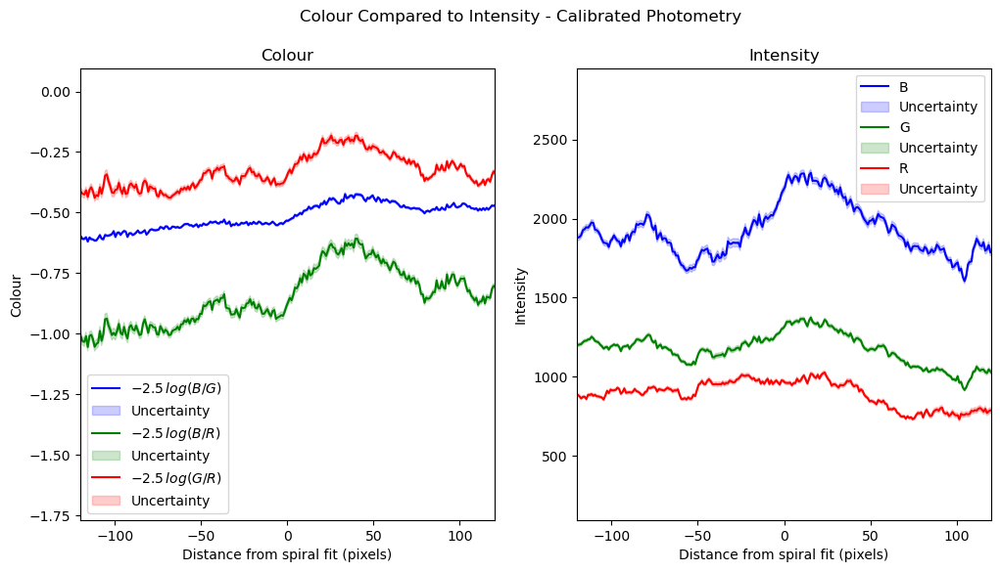

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

fig.suptitle('Colour Compared to Intensity - Calibrated Photometry')

axs[0].set_title('Colour')
axs[0].set_ylabel('Colour')
axs[0].set_xlabel('Distance from spiral fit (pixels)')

axs[0].plot(distance_to_fit,B_colour_avg_radii,'b')
axs[0].fill_between(distance_to_fit, B_colour_avg_radii - (B_colour_std_radii/np.sqrt(B_colour_std_radii.shape[0])), B_colour_avg_radii + (B_colour_std_radii/np.sqrt(B_colour_std_radii.shape[0])), alpha=0.2, color='blue')

axs[0].plot(distance_to_fit,G_colour_avg_radii,'g')
axs[0].fill_between(distance_to_fit, G_colour_avg_radii - (G_colour_std_radii/np.sqrt(G_colour_std_radii.shape[0])), G_colour_avg_radii + (G_colour_std_radii/np.sqrt(G_colour_std_radii.shape[0])), alpha=0.2, color='green')

axs[0].plot(distance_to_fit,R_colour_avg_radii,'r')
axs[0].fill_between(distance_to_fit, R_colour_avg_radii - (R_colour_std_radii/np.sqrt(R_colour_std_radii.shape[0])), R_colour_avg_radii + (R_colour_std_radii/np.sqrt(R_colour_std_radii.shape[0])), alpha=0.2, color='red')

axs[0].legend(['$-2.5\, log(B/G)$','Uncertainty','$-2.5\, log(B/R)$','Uncertainty','$-2.5\, log(G/R)$','Uncertainty'])
axs[0].set_xlim(-half_arm_width,half_arm_width)
#axs[0].set_ylim(np.min(G_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])-0.2,
         #np.max(B_R_colour_avg_radii[(500-half_arm_width):(500+half_arm_width)])+0.1)

axs[1].set_title('Intensity')
axs[1].set_ylabel('Intensity')
axs[1].set_xlabel('Distance from spiral fit (pixels)')

axs[1].plot(-1*distance_to_fit,B_intensity_avg_radii,'b')
axs[1].fill_between(-1*distance_to_fit, B_intensity_avg_radii - (B_intensity_std_radii/np.sqrt(B_intensity_std_radii.shape[0])), B_intensity_avg_radii + (B_intensity_std_radii/np.sqrt(B_intensity_std_radii.shape[0])), alpha=0.2, color='blue')

axs[1].plot(-1*distance_to_fit,G_intensity_avg_radii,'g')
axs[1].fill_between(-1*distance_to_fit, G_intensity_avg_radii - (G_intensity_std_radii/np.sqrt(G_intensity_std_radii.shape[0])), G_intensity_avg_radii + (G_intensity_std_radii/np.sqrt(G_intensity_std_radii.shape[0])), alpha=0.2, color='green')

axs[1].plot(-1*distance_to_fit,R_intensity_avg_radii,'r')
axs[1].fill_between(-1*distance_to_fit, R_intensity_avg_radii - (R_intensity_std_radii/np.sqrt(R_intensity_std_radii.shape[0])), R_intensity_avg_radii + (R_intensity_std_radii/np.sqrt(R_intensity_std_radii.shape[0])), alpha=0.2, color='red')

#axs[1].plot(-1*distance_to_fit,Average_intensity,'k')

axs[1].set_xlim(-half_arm_width,half_arm_width)
#axs[1].set_ylim(17000,36000)
axs[1].legend(['B','Uncertainty','G','Uncertainty','R','Uncertainty'])

plt.show()

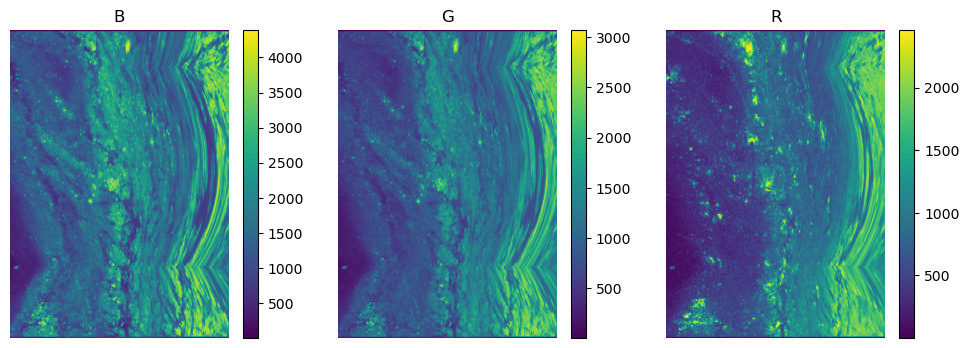

In [ ]:

# Having a look

import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))

im1 = ax1.imshow(calibrated_stacked_B.T, aspect='auto')
ax1.set_title('B')
ax1.axis('off')
fig.colorbar(im1, ax=ax1)

im2 = ax2.imshow(calibrated_stacked_G.T, aspect='auto')
ax2.set_title('G')
ax2.axis('off')
fig.colorbar(im2, ax=ax2)

im3 = ax3.imshow(calibrated_stacked_R.T, aspect='auto')
ax3.set_title('R')
ax3.axis('off')
fig.colorbar(im3, ax=ax3)

plt.show()



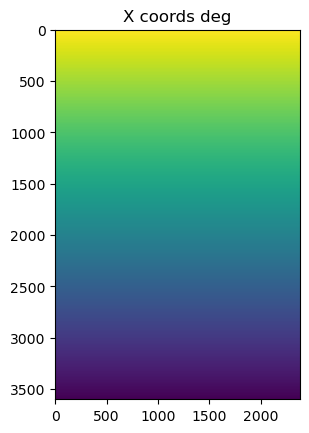

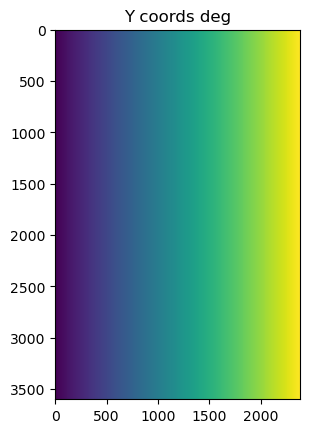

In [ ]:
# Getting a galctic extinction map

# First get pixel size in degrees

hdul = fits.open(fits_path)

fits_info = {}  # Create dictionary for header info
for key, value in hdul[0].header.items():
    fits_info[key] = value

# Retreive Pixel conversion factors
X_deg = fits_info['CD1_1'] 
Y_deg = fits_info['CD2_2'] 

# Central co-ordinate : 
# RA: 202.469649065253
# DEC: 47.1952253876512

Centre_RA  = 202.469649065253
Centre_DEC = 47.1952253876512

# The image is upside down M51a is to the North
# remember this and convert co-ords at the end

# Now we need to measure all of the pixel indicese in terms of difference to the central pixel index
# and then multiply them by the transformation indeicese in degrees

# First we need the central pixel from the table and image shape

# Test image will be M51_B

x0 = int(M51_B_Table['x'] + M51_B.shape[1]/2)

y0 = int(M51_B_Table['y'] + M51_B.shape[0]/2)

#plt.imshow(M51_B)
#plt.plot(x0,y0,'kx')
# So definately the centre

# Get pixel indices

indices = np.indices(M51_B.shape)

X_indices = indices[0] - x0
Y_indices = indices[1] - y0

X_indices.shape,Y_indices.shape

Relative_pixel_coords = np.dstack([X_indices,Y_indices])

# Now Multiply all 

X_pixel_coords_degrees = Centre_RA + X_deg*X_indices
Y_pixel_coords_degrees = Centre_DEC + Y_deg*Y_indices

pixel_coords_degrees = np.dstack([X_pixel_coords_degrees,Y_pixel_coords_degrees])

plt.figure()
plt.title('X coords deg')
plt.imshow(pixel_coords_degrees[:,:,0])
plt.figure()
plt.title('Y coords deg')
plt.imshow(pixel_coords_degrees[:,:,1])

In [ ]:
from astropy.coordinates import SkyCoord
import astropy.units as u

# Convert the J2000 to Degrees

J2000_RA = np.array(['13h30m1.318s','13h30m0.974s','13h30m0.626s','13h30m0.260s','13h29m9.634s','13h30m1.403s','13h30m1.014s','13h30m0.707s',
                    '13h30m0.531s','13h30m0.311s','13h29m9.634s','13h29m4.879s','13h29m4.491s','13h29m4.165s','13h29m3.206s','13h30m2.113s',
                    '13h30m3.047s','13h30m3.918s','13h30m5.127s','13h30m5.896s','13h30m6.932s','13h29m4.689s','13h29m6.362s','13h29m7.560s',
                    '13h29m9.347s','13h29m0.354s','13h29m1.083s','13h29m2.295s','13h29m5.026s','13h29m7.109s','13h29m0.629s','13h29m0.500s',
                    '13h29m0.211s','13h29m4.762s','13h29m3.868s','13h29m2.858s','13h29m1.993s','13h29m9.272s','13h29m7.156s','13h29m3.876s',
                    '13h29m8.025s','13h29m0.826s','13h29m3.108s','13h29m5.184s','13h29m6.781s','13h30m0.959s','13h30m2.091s','13h30m2.900s',
                    '13h30m4.585s','13h30m0.959s','13h30m1.956s','13h30m2.812s','13h30m5.116s','13h30m5.804s','13h30m3.475s','13h30m3.376s',
                    '13h30m3.274s','13h30m2.322s','13h29m2.936s','13h29m3.236s','13h29m3.569s','13h29m4.064s','13h29m4.675s','13h30m6.746s',
                    '13h30m6.987s','13h30m8.492s','13h29m8.802s','13h29m4.250s','13h29m9.761s','13h30m6.877s','13h30m5.002s','13h30m4.684s',
                    '13h30m1.959s','13h30m0.355s','13h29m8.678s','13h29m7.902s','13h29m7.129s','13h29m6.356s','13h29m1.416s','13h29m5.312s',
                    '13h29m4.543s','13h29m4.012s','13h29m3.060s','13h29m2.625s','13h29m9.370s','13h29m2.053s','13h29m9.087s','13h29m8.275s',
                    '13h29m5.726s','13h29m2.544s','13h29m7.131s','13h29m6.323s','13h29m5.437s','13h29m0.541s','13h29m7.567s','13h29m6.252s',
                    '13h29m2.698s','13h29m4.712s','13h29m2.698s','13h30m4.464s','13h30m7.379s','13h30m8.280s','13h30m1.117s','13h29m0.819s',
                    '13h29m3.701s','13h29m4.304s','13h29m9.885s','13h29m1.830s','13h29m8.796s','13h29m6.681s','13h30m1.260s','13h30m2.161s',
                    '13h30m6.731s'])

J2000_DEC = np.array(['47d12m9.427s','47d13m3.463s','47d13m7.758s','47d13m2.741s','47d13m8.326s','47d12m5.939s','47d13m1.924s','47d13m4.408s',
                      '47d13m1.535s','47d13m0.654s','47d13m8.326s','47d09m7.650s','47d09m7.670s','47d10m3.048s','47d11m7.137s','47d11m9.316s',
                      '47d12m8.364s','47d12m6.216s','47d13m0.949s','47d13m6.646s','47d13m7.850s','47d12m8.622s','47d12m2.866s','47d12m5.887s',
                      '47d12m0.432s','47d12m3.014s','47d12m4.854s','47d12m7.917s','47d13m0.791s','47d13m0.363s','47d09m3.297s','47d09m8.318s',
                      '47d10m5.049s','47d09m9.469s','47d10m3.378s','47d10m0.267s','47d11m3.421s','47d08m1.315s','47d09m5.832s','47d10m3.982s',
                      '47d10m0.862s','47d10m5.504s','47d10m9.322s','47d10m2.741s','47d10m5.406s','47d09m9.408s','47d09m6.368s','47d09m8.576s',
                      '47d10m3.804s','47d09m9.408s','47d09m4.390s','47d09m7.244s','47d10m1.796s','47d10m2.096s','47d09m7.840s','47d09m4.292s',
                      '47d10m1.815s','47d14m7.911s','47d11m0.079s','47d11m1.106s','47d11m3.274s','47d12m1.552s','47d12m4.019s','47d11m3.171s',
                      '47d11m5.297s','47d12m0.718s','47d09m2.242s','47d09m3.365s','47d10m0.805s','47d12m6.095s','47d13m8.036s','47d13m1.087s',
                      '47d13m2.798s','47d13m5.584s','47d13m8.932s','47d13m5.098s','47d14m1.251s','47d14m7.444s','47d11m9.316s','47d11m1.285s',
                      '47d12m1.225s','47d12m4.944s','47d12m9.595s','47d12m0.828s','47d10m3.181s','47d11m7.357s','47d11m9.316s','47d14m8.694s',
                      '47d14m1.251s','47d13m1.953s','47d13m6.161s','47d14m0.713s','47d14m8.488s','47d13m6.032s','47d13m8.465s','47d13m5.156s',
                      '47d11m2.617s','47d11m8.629s','47d11m2.617s','47d12m7.279s','47d11m9.255s','47d12m9.963s','47d11m9.335s','47d09m8.394s',
                      '47d08m8.541s','47d09m8.178s','47d11m3.551s','47d12m8.038s','47d12m2.349s','47d12m2.509s','47d13m1.159s','47d12m6.994s',
                      '47d14m0.010s'])

ra_deg = np.empty_like(J2000_RA)
dec_deg = np.empty_like(J2000_RA)

for i in range(0,len(J2000_RA)):
    # Create a SkyCoord object with the J2000 coordinates
    j2000_coord = SkyCoord(J2000_RA[i], J2000_DEC[i], frame='icrs')

    # Extract the decimal degree values for the right ascension and declination
    ra_deg[i] = j2000_coord.ra.degree
    dec_deg[i] = j2000_coord.dec.degree
    


In [ ]:
RA_degrees_array = np.asarray(ra_deg).astype(float)
RA_degrees_array

array([202.50549166, 202.50405833, 202.50260833, 202.50108333,
       202.29014166, 202.50584583, 202.50422499, 202.50294583,
       202.50221249, 202.50129583, 202.29014166, 202.27032916,
       202.26871249, 202.26735416, 202.26335833, 202.50880416,
       202.51269583, 202.51632499, 202.52136249, 202.52456666,
       202.52888333, 202.26953749, 202.27650833, 202.28149999,
       202.28894583, 202.25147499, 202.25451249, 202.25956249,
       202.27094166, 202.27962083, 202.25262083, 202.25208333,
       202.25087916, 202.26984166, 202.26611666, 202.26190833,
       202.25830416, 202.28863333, 202.27981666, 202.26614999,
       202.28343749, 202.25344166, 202.26294999, 202.27159999,
       202.27825416, 202.50399583, 202.5087125 , 202.51208333,
       202.51910416, 202.50399583, 202.50814999, 202.51171666,
       202.52131666, 202.52418333, 202.51447916, 202.51406666,
       202.51364166, 202.509675  , 202.26223333, 202.26348333,
       202.26487083, 202.26693333, 202.26947916, 202.52

In [ ]:
DEC_degrees_array = np.asarray(dec_deg).astype(float) 
DEC_degrees_array

array([47.20261861, 47.21762861, 47.21882167, 47.21742805, 47.21897944,
       47.20164972, 47.21720111, 47.21789111, 47.21709305, 47.21684833,
       47.21897944, 47.152125  , 47.15213055, 47.16751333, 47.18531583,
       47.18592111, 47.20232333, 47.20172667, 47.21693028, 47.21851278,
       47.21884722, 47.202395  , 47.20079611, 47.20163528, 47.20012   ,
       47.20083722, 47.20134833, 47.20219917, 47.21688639, 47.2167675 ,
       47.15091583, 47.15231055, 47.16806917, 47.15263028, 47.167605  ,
       47.16674083, 47.18428361, 47.13369861, 47.15162   , 47.16777278,
       47.16690611, 47.16819555, 47.16925611, 47.16742806, 47.16816833,
       47.15261333, 47.15176889, 47.15238222, 47.16772333, 47.15261333,
       47.15121944, 47.15201222, 47.16716555, 47.16724889, 47.15217778,
       47.15119222, 47.16717083, 47.23553083, 47.18335528, 47.18364055,
       47.18424278, 47.20043111, 47.20111639, 47.18421417, 47.18480472,
       47.20019944, 47.15062278, 47.15093472, 47.16689028, 47.20

In [ ]:
# So now we have all of the positions in degrees and we have an image with all of the pixels in degrees so now we need
# to find the nearest pixel index for each RA and DEC and then plot an x on the image at this index

RA_degrees_array = np.asarray(ra_deg).astype(float)
DEC_degrees_array = np.asarray(dec_deg).astype(float) 

RA_centre_offset  = RA_degrees_array - Centre_RA
DEC_centre_offset = DEC_degrees_array - Centre_DEC

centre_offset_X = np.empty_like(RA_degrees_array)

centre_offset_Y = np.empty_like(DEC_degrees_array)

for i in range(0,len(DEC_degrees_array)):
    centre_offset_X[i] = RA_centre_offset[i]/(X_deg*1)
    centre_offset_Y[i]  = DEC_centre_offset[i]/(Y_deg*1)
    
    

In [ ]:
centre_offset_X, centre_offset_Y

(array([ -806.26222047,  -774.02013987,  -741.40307551,  -707.09892162,
         4037.93420011,  -814.22910714,  -777.76907777,  -748.99497843,
         -732.49884189,  -711.87900864,  4037.93420011,  4483.60701916,
         4519.97324636,  4550.52823741,  4640.41254381,  -880.77534163,
         -968.31661809, -1049.95285622, -1163.26903671, -1235.34532575,
        -1332.44677624,  4501.41526146,  4344.60951186,  4232.3244805 ,
         4064.8338305 ,  4907.72265801,  4839.39553181,  4725.79816973,
         4469.82912128,  4274.59529612,  4881.94752903,  4894.03833737,
         4921.12557212,  4494.57310114,  4578.36521475,  4673.02960817,
         4754.10370807,  4071.86337023,  4270.19019287,  4577.61547216,
         4188.74133415,  4863.48334631,  4649.59795903,  4455.02029923,
         4305.33789154,  -772.61423193,  -878.71349327,  -954.53872021,
        -1112.46897122,  -772.61423193,  -866.06009681,  -946.29065194,
        -1162.23811253, -1226.72249866, -1008.43178318,  -999.15

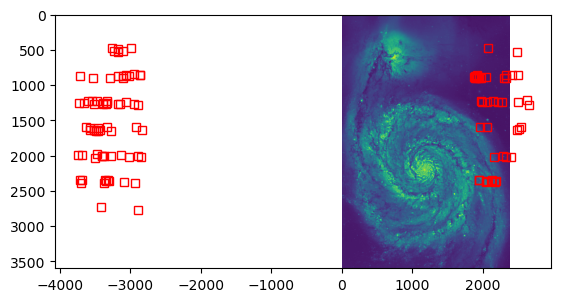

In [ ]:
plt.figure()
plt.imshow(np.flipud(M51_B))
plt.xticks()
for i in range(0,len(centre_offset_X)):
    plt.plot(-1*centre_offset_X[i]+x0,-1*centre_offset_Y[i]+y0,c='r',marker='s',fillstyle='none')

In [ ]:
# Need to make the axes have 4 ticks sampled from the RA and DEC values 



In [ ]:
for i in range(0,100):
    print('I am so unhappy')

I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so unhappy
I am so 

In [ ]:
valB = gfits.flux_fraction(M51_B_I,M51_B_Table,M51_B,False)
valB

0.11292828118736206

In [ ]:
valG = gfits.flux_fraction(M51_G_I,M51_G_Table,M51_G,False)
valR = gfits.flux_fraction(M51_R_I,M51_R_Table,M51_R,False)